# Clusterização sobre o dataset NIPS 1987-2015

## Referências
\[1\] [Witten, Ian H., et al. Data Mining: Practical machine learning tools and techniques. Morgan Kaufmann, 2016.](https://www.cs.waikato.ac.nz/ml/weka/book.html)


\[2\] [Prince, Simon JD. Computer vision: models, learning, and inference. Cambridge University Press, 2012.](http://www.computervisionmodels.com/)


\[3\] [Tan, Pang-Ning. Introduction to data mining. Pearson Education India, 2006.](http://www-users.cs.umn.edu/~kumar/dmbook/index.php)


\[4\] [Derman, Esther, and Erwan Le Pennec. "Clustering and Model Selection via Penalized Likelihood for Different-sized Categorical Data Vectors." arXiv:1709.02294v1 (math.ST) (2017).](https://arxiv.org/abs/1709.02294)

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
from time import time
%matplotlib notebook

In [53]:
dataset = pd.read_csv('NIPS_1987-2015_transpose.csv')

In [55]:
dataset = dataset.drop('Unnamed: 0', axis=1)

In [3]:
X = pd.read_csv('NIPS_1987-2015_remodeled_755.csv')
y = X.loc[:, 'y']
X = X.drop('y', axis=1)

In [5]:
X_300 = pd.read_csv('NIPS_1987-2015_remodeled_300.csv')
y_300 = X_300.loc[:, 'y']
X_300 = X_300.drop('y', axis=1)

## Gaussian Mixtures

Modelo de mistura gaussiana são modelos probabilísticos para representar populações distribuidas de forma normalizada. Em geral, _gaussian mixtures_ não necessitam de conhecimento prévio sobre qual subpopulação do conjunto de dados um certo ponto pertence, dessa forma se caracteriza como um modelo não-supervisionado, podendo aprender as subpopulações automaticamente.

<center> Um exemplo de mistura gaussiana de três distribuições normais. </center>
![mixture model](https://ds055uzetaobb.cloudfront.net/image_optimizer/d47c612ae8c3dc7f5aef1fc66458456f4eea4145.png)

Por ser um modelo probabilístico, podemos dizer que esse método é um K-Means mais ameno, onde a classificação de um ponto não é deterministico e sim é calculada uma probabilidade de tal ponto pertencer a um subconjunto.

Um exemplo disso é a imagem abaixo, onde podemos notar a pobabilidade de um ponto pertencer a um ou outro _cluster_

![kmeansvsgmm](http://slideplayer.com/4559680/15/images/32/k-means+v.s.+Gaussian+Mixture.jpg)

Para um modelo **uni-dimensional** temos a seguinte fórmula:

$$ 
p(x) = \sum_{i=1}^K\phi_i \mathcal{N}(x \;|\; \mu_i, \sigma_i)
$$

$$
\mathcal{N}(x \;|\; \mu_i, \sigma_i) = \frac{1}{\sigma_i\sqrt{2\pi}} \exp\left(-\frac{(x-\mu_i)^2}{2\sigma_i^2}\right)
$$

$$
\sum_{i=1}^K\phi_i = 1
$$

Onde, uma mistura de modelos gaussianos (GMM) é parametrizada por dois tipos de valores, os pesos dos componentes de mistura ($\phi_k$) e o componente de médias ($\mu_k$) e variâncias/covariâncias ($\sigma_k$), para cada componente $k_i$ no conjunto de $K$ componentes.

### _Expectation-Maximization_

O algoritmo de EM é um procedimento eficiente e iterativo de calcular o _Maximum Likelihood_ (máxima verossimilhança) na presença de dados faltantes. Com a utilização desse algoritmo temos o objetivo de estimar parâmetros do modelo para qual os dados são mais prováveis de apresentar.

Cada iteração do algoritmo de EM consiste me dois passos:

* _Estimation_: Os dados faltantes são estimados para cada ponto $x_i \in X$ dado os parâmetros do modelo;
* _Maximization_: Consiste em maximizar as estimativas calculadas no passo anterior de acordo com os parâmetros do modelo, então esse passo atualiza os valores de $\phi_k$, $\mu_k$ e $\sigma_k$.

O processo se repete até o ponto de convergência do algoritmo, gerando um _maximum likelihood_.

<center>Exemplo do algoritmo _EM_ atualizando parâmetros de dois componentes.</center>
![EMloop](https://ds055uzetaobb.cloudfront.net/image_optimizer/ad8e9b45e3d01deef10f0cc07ec22144c3c631b3.gif)



## Escolhendo um K

Para essa etapa do problema encontramos diversos desafios, entre eles:

* Recursos computacionais;
* Métricas com valores anormais;
* Difícil tomada de decisão sem conhecer todas as possibilidades (constante incerteza).


### _KMeans_ <label style="font-size: 10px">Felipe Borges</label>

K Means, também chamado de médias móveis, realiza agrupamentos de pontos no conjunto de dados com base na distância de cada ponto para os centróides de cada _cluster_. Dessa forma esse método se torna dependente de uma boa inicialização de seus centróides e a criação de seus _clusters_ são de forma deterministica.

Para o _KMeans_, foi utilizada o método do cotovelo (_Elbow_) juntamente com a métrica de silhueta e Calinski.

#### _Elbow Method_

O método de Elbow análise o valor do erro quadrático entre os clusters (_Within-Clusters Sum of Squares_, WCSS) , no caso do sklearn a inertia.

![Elbowmethod](https://image.slidesharecdn.com/kmeans-demo-150305202643-conversion-gate01/95/kmeans-with-canopy-clustering-25-638.jpg?cb=1425608917)

#### _Silhouette Score_

A silhueta é definida pela formula 

$$
S = \frac{(b-a)}{max(a,b)}
$$

Sendo:

- $a$: Distância média entre um ponto e os outros da mesma classe.
- $b$: Distância média entre um ponto e os outros da classe mais próxima.

Esse coeficiente esta no intervalo $]-1,1 [$ sendo que quanto mais próximo de 1 o coeficiente é ótimo e quanto mais perto de -1 o pior, valores perto de 0 podem demonstrar overlapping entre os clusters.

#### _Calinski_

Calinski analisa a dispersão média entre os clusters e quanto maior o seu valor melhor.

In [2]:
# importa o dataset 
data = pd.read_csv('data_remake.csv')

In [3]:
# Descrição 

print(data.head())
data.shape

  Unnamed: 0  abalon  abbeel  abbot  abbrevy  abc  abel  abernethy  abl  \
0     1987_1       0       0      0        0    0     0          0    2   
1     1987_2       0       0      0        0    0     0          0    1   
2     1987_3       0       0      0        0    0     0          0    2   
3     1987_4       0       0      0        0    0     0          0    0   
4     1987_5       0       0      0        0    0     0          0    1   

   abnorm   ...    zhou  zhu  zien  zilberstein  zon  zoo  zoom  zou  zoubin  \
0       0   ...       0    0     0            0    0    0     0    0       0   
1       0   ...       0    0     0            0    0    0     0    0       0   
2       0   ...       0    0     0            0    0    0     0    0       0   
3       0   ...       0    0     0            0    0    0     0    0       0   
4       0   ...       0    0     0            0    0    0     0    0       0   

   zurich  
0       0  
1       0  
2       0  
3       0  
4       

(5811, 5986)

In [4]:
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabaz_score
from sklearn.cluster import KMeans

def kmeans_analysis(input_data, tot_range=[1,20]):
        """
            Método que realiza algumas análises no modelo KMeans.
            
            As análises são plotadas e os vetores resultados são retornados ao final da função.
            
            Métodos utilizados:
            
            Elbow Method:
                O método de Elbow análise o valor do erro quadrático entre os clusters, no caso do sklearn a inertia
            
            Silhouette Score:
                A silhueta é definida pela formula (b-a)/max(a,b) sendo:
                - a: distância média entre um ponto e os outros da mesma classe.
                - b: distância média entre um ponto e os outros da classe mais próxima.
            
                Esse coeficiente esta no intervalo ]-1,1 [ sendo que quanto mais próximo de 1 o coeficiente é ótimo
                e quanto mais perto de -1 o pior, valores perto de 0 podem demonstrar overlapping entre os clusters.
                
            Calinski:
                Calinski analisa a dispersão média entre os clusters e quanto maior o seu valor melhor.
                
                Obs*: O método de calinski é um pouco mais complexo de explicar aqui, vou linkar referências ao
                      ao final do notebook.
            
        """
        
        erro = []
        silhueta = []
        calinski = []
        
        
        # Realiza para todos os k 
        for k in range(tot_range[0], tot_range[1]+1):
            modelo = KMeans(n_clusters=k).fit(input_data)
            
            # Inertia
            erro.append(modelo.inertia_)
            
            # Silhueta
            silhueta.append( silhouette_score(input_data, modelo.labels_) )
            
            # Calinski
            calinski.append( calinski_harabaz_score(input_data, modelo.labels_) )
        

        
        # Plot do Elbow Method
        plt.figure(1)
        
        plt.xlabel('Clusters')
        plt.ylabel('Inertia')
        plt.grid(True)
        plt.xticks(range(tot_range[0], tot_range[1]+1))
        
        plt.plot( range(tot_range[0], tot_range[1]+1), erro, c='blue')
        plt.scatter(range(tot_range[0], tot_range[1]+1), erro, c='red')
    
    
        # Plot Silhueta
        plt.figure(2)
        
        plt.xticks(range(tot_range[0], tot_range[1]+1))
        plt.title('Silhueta')
        plt.xlabel('Clusters')
        plt.ylabel('Silhueta')
        plt.grid(True)
        
        plt.plot(range(tot_range[0], tot_range[1]+1), silhueta )
        plt.scatter(range(tot_range[0], tot_range[1]+1), silhueta, c='red')
        # Plot Calinski
        plt.figure(3)
        
        plt.xlabel('Clusters')
        plt.ylabel('Y')
        plt.xticks(range(tot_range[0], tot_range[1]+1))
        plt.grid(True)
        
        plt.plot(range(tot_range[0], tot_range[1]+1), calinski)
        plt.scatter(range(tot_range[0], tot_range[1]+1), calinski, c='red')
        plt.show()
        
        return [erro ,calinski, silhueta]

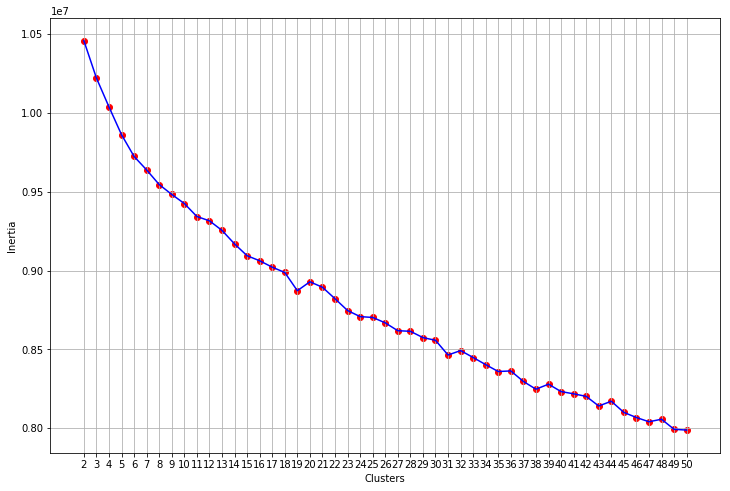

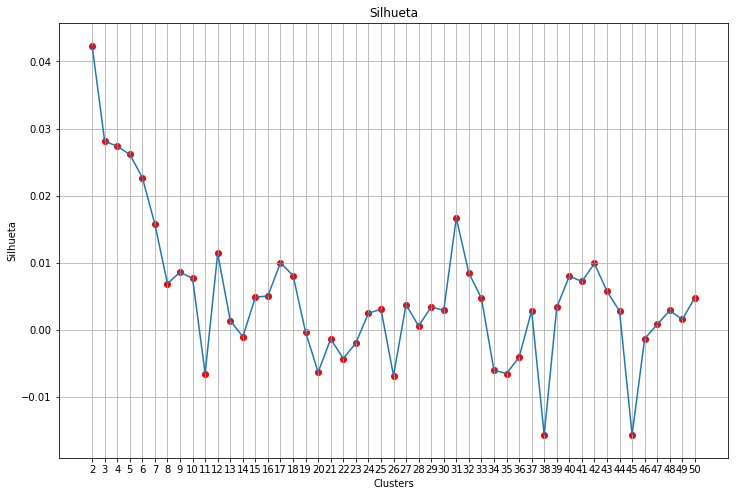

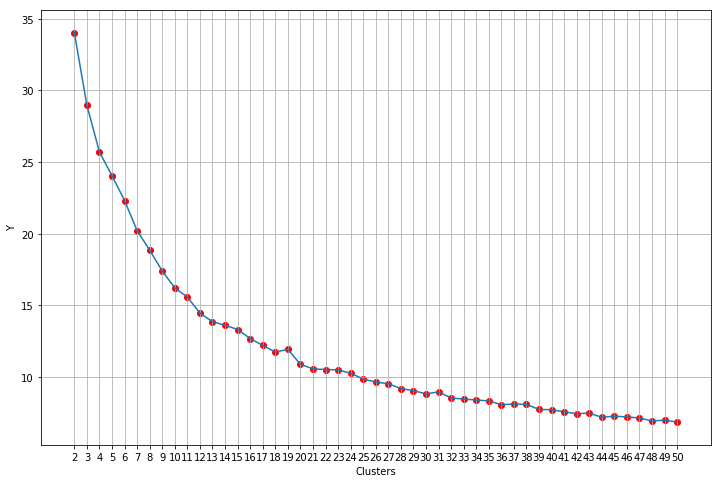

NameError: name 'result' is not defined

In [6]:
kmeans_analysis(data.iloc[:1000, 1:5000], [2,50])

### _Gaussian Mixtures_
Para a escolha de um K ótimo, utilizamos a métrica BIC, juntamente com a AIC, que quando minimizadas apontam a melhor escolha de um K.

#### BIC (_Bayesian information criterion_)

Em estatística o BIC é um critério para seleção de modelos dentro de um conjunto finito de modelos, sendo que o modelo com menor BIC é o escolhido. Para contornar o caso de _overfitting_ o BIC adiciona um termo de penalização para o numero de parâmetros em um modelo. Pode ser usado para escolher o número de _clusters_ de acordo com a complexidade intrínseca presente em um conjunto de dados.

In [6]:
from sklearn.mixture import GaussianMixture

---
Com o uso de GMM e coletando as métricas BIC e AIC, conseguimos plotar os gráficos seguintes. Porém, nenhum deles nos mostrou resultados utilizáveis, tanto pelos valores altamente discrepantes, como pela alta variação das métricas conforme o número de componentes aumentava.

#### _Dataset_ $[5804 x 755]$

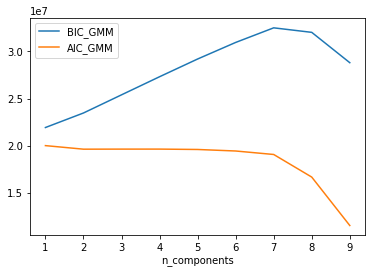

In [4]:
n_components = np.arange(1, 10)
models_gmm = [GaussianMixture(n_components=n, covariance_type='full', max_iter=300).fit(X)
          for n in n_components]

plt.plot(n_components, [m.bic(X) for m in models_gmm], label='BIC_GMM')
plt.plot(n_components, [m.aic(X) for m in models_gmm], label='AIC_GMM')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.show()

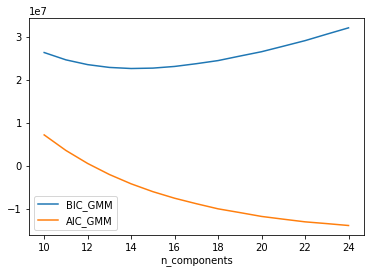

In [5]:
n_components = np.arange(10, 25)
models_gmm = [GaussianMixture(n_components=n, covariance_type='full', max_iter=300).fit(X)
          for n in n_components]

plt.plot(n_components, [m.bic(X) for m in models_gmm], label='BIC_GMM')
plt.plot(n_components, [m.aic(X) for m in models_gmm], label='AIC_GMM')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.show()

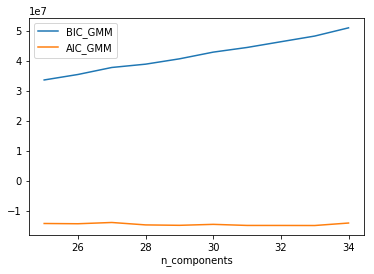

In [3]:
n_components = np.arange(25, 35)
models_gmm = [GaussianMixture(n_components=n, covariance_type='full', max_iter=300).fit(X)
          for n in n_components]

plt.plot(n_components, [m.bic(X) for m in models_gmm], label='BIC_GMM')
plt.plot(n_components, [m.aic(X) for m in models_gmm], label='AIC_GMM')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.show()

<IPython.core.display.Javascript object>


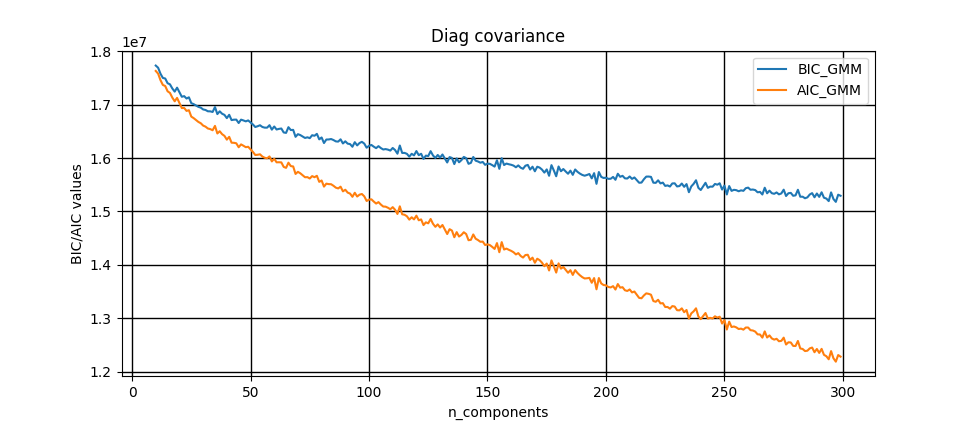

In [56]:
gmms_diag = draw_aic_bic(np.arange(10, 300), X, title='Diag covariance', cov='diag')

---
Após tais testes recorremos a literatura [\[4\]](#Referências) e encontramos uma implementação do algoritmo _EM_, onde é feita a proposta de um algoritimo robusto para EM, com diferente tipo de penalização (Kullback-Leibler). Essa proposta é feita para encontrar um número ótimo de _clusters_ a partir da calibração da penalização.

Seguindo a literatura, testamos a aplicação de **100 clusters** no nosso dataset com tamanho igual a $[5804x755]$, o que difere das 300 features apresentadas na literatura. Essa decisão foi tomada, com o objetivo que depois esse número de _clusters_ seja reduzido utilizando as técnicas apresentadas no artigo.

In [12]:
from EM import expectationMaximisation2

thresholdConvergence = 1
epsilon = .01
deltaInit = 0
L = len(X)
B = 755
K = 100

In [13]:
P,Pi,Rpost,logScore,logScores = expectationMaximisation2(X.values,
                                                         K,
                                                         L,
                                                         B,
                                                         thresholdConvergence,
                                                         200)

1 -th short run of EM
Compute likelihood using current responsibility...
Number of bins:   755
Initial logScore:  -111593790.555
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:

M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
4 -th short run of EM
Compute likelihood using current responsibility...
Number of bins:   755
Initial logScore:  -112637265.636
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Nu

Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...

E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bi

M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bin

M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
15 -th short run of EM
Compute likelihood using current responsibility...
Number of bins:   755
Initial logScore:  -104319542.857
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
N

Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...

E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bi

M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bin

M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
E-step ...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
Itération number:  16 / Last logScore:  -30567128.3959 / New log score:  -30565605.5469 / Difference attained:  1522.84897841
Current pi parameter:  [[  1.72295089e-04]
 [  3.34707609e-06]
 [  1.18888707e-02]
 [  1.37834689e-02]
 [  1.72294969e-06]
 [  1.34390120e-02]
 [  1.43024063e-02]
 [  1.72294969e-04]
 [  1.72294969e-04]
 [  2.61873799e-02]
 [  2.23981538e-02]
 [  2.87730434e-02]
 [  1.72294969e-04]
 [  4.2

M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
Itération number:  20 / Last logScore:  -30562965.8496 / New log score:  -30562532.4305 / Difference attained:  433.419134632
Current pi parameter:  [[  1.72295089e-04]
 [  3.34708256e-06]
 [  1.20606483e-02]
 [  1.39539838e-02]
 [  1.72294969e-06]
 [  1.34390135e-02]
 [  1.48355300e-02]
 [  1.72294969e-04]
 [  1.72294969e-04]
 [  2.61758103e-02]
 [  2.29158663e-02]
 [  2.87609274e-02]
 [  1.72294969e-04]
 [  4.14590214e-02]
 [  3.25636977e-02]
 [  4.60293946e-02]
 [  5.16884907e-04]
 [  1.30472786e-02]
 [  1.96869090e-02]
 [  1.72294969e-06]
 [  1.43008479e-02]
 [  2.60165193e-02]
 [  1.72294969e-04]
 [  1.33803148e-05]
 [  1.56788419e-04]
 [  1.72294969e-06]
 [  1.33803148e-05]
 [  1.72294969e-06]
 [  1.33803148e-05]
 [  9.01050606e-06]
 [  3.13658407e-02]
 [  1.72294980e-04]
 [  1.32666908e-02]
 [  3.48037459e-02]
 [  1.72294969e-04]
 [  8.61474845e-04]


M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
Itération number:  24 / Last logScore:  -30560402.0369 / New log score:  -30560071.2482 / Difference attained:  330.788684193
Current pi parameter:  [[  1.72295089e-04]
 [  3.34708185e-06]
 [  1.20606485e-02]
 [  1.48377967e-02]
 [  1.72294969e-06]
 [  1.34390116e-02]
 [  1.48173677e-02]
 [  1.72294969e-04]
 [  1.72294969e-04]
 [  2.61692847e-02]
 [  2.30876698e-02]
 [  2.84576196e-02]
 [  1.72294969e-04]
 [  4.13506240e-02]
 [  3.24116311e-02]
 [  4.61754846e-02]
 [  5.16884907e-04]
 [  1.25976408e-02]
 [  1.99850268e-02]
 [  1.72294969e-06]
 [  1.44745395e-02]
 [  2.58442730e-02]
 [  1.72294969e-04]
 [  1.33803119e-05]
 [  1.56788419e-04]
 [  1.72294969e-06]
 [  1.33803119e-05]
 [  1.72294969e-06]
 [  1.33803119e-05]
 [  9.01050415e-06]
 [  3.11265889e-02]
 [  1.72294980e-04]
 [  1.32666907e-02]
 [  3.47953105e-02]
 [  1.72294969e-04]
 [  8.61474845e-04]


M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
Itération number:  28 / Last logScore:  -30558475.6705 / New log score:  -30557625.5875 / Difference attained:  850.083014995
Current pi parameter:  [[  1.72295089e-04]
 [  3.34708138e-06]
 [  1.20606487e-02]
 [  1.67141032e-02]
 [  1.72294969e-06]
 [  1.34390154e-02]
 [  1.48173677e-02]
 [  1.72294969e-04]
 [  1.72294969e-04]
 [  2.60503341e-02]
 [  2.30878955e-02]
 [  2.80823721e-02]
 [  1.72294969e-04]
 [  4.13508325e-02]
 [  3.25630647e-02]
 [  4.61189262e-02]
 [  5.16884907e-04]
 [  1.31531282e-02]
 [  2.00221056e-02]
 [  1.72294969e-06]
 [  1.49897421e-02]
 [  2.54991659e-02]
 [  1.72294969e-04]
 [  1.33803100e-05]
 [  1.56788419e-04]
 [  1.72294969e-06]
 [  1.33803100e-05]
 [  1.72294969e-06]
 [  1.33803100e-05]
 [  9.01050287e-06]
 [  3.08414283e-02]
 [  1.72294980e-04]
 [  1.32666906e-02]
 [  3.48027694e-02]
 [  1.72294969e-04]
 [  8.61474845e-04]


M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
Itération number:  32 / Last logScore:  -30557108.5115 / New log score:  -30556907.7881 / Difference attained:  200.723391443
Current pi parameter:  [[  1.72295089e-04]
 [  3.34708183e-06]
 [  1.20606483e-02]
 [  1.69554911e-02]
 [  1.72294969e-06]
 [  1.34390151e-02]
 [  1.48173677e-02]
 [  1.72294969e-04]
 [  1.72294969e-04]
 [  2.57154546e-02]
 [  2.30867435e-02]
 [  2.80793970e-02]
 [  1.72294969e-04]
 [  4.13503758e-02]
 [  3.25628908e-02]
 [  4.63480883e-02]
 [  5.16884907e-04]
 [  1.32681360e-02]
 [  2.01567530e-02]
 [  1.72294969e-06]
 [  1.49897522e-02]
 [  2.54987192e-02]
 [  1.72294969e-04]
 [  1.33803118e-05]
 [  1.56788419e-04]
 [  1.72294969e-06]
 [  1.33803118e-05]
 [  1.72294969e-06]
 [  1.33803118e-05]
 [  9.01050408e-06]
 [  3.08413147e-02]
 [  1.72294980e-04]
 [  1.32666906e-02]
 [  3.48044771e-02]
 [  1.72294969e-04]
 [  8.61474845e-04]


M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
Itération number:  36 / Last logScore:  -30556066.1094 / New log score:  -30555786.7034 / Difference attained:  279.406044222
Current pi parameter:  [[  1.72295089e-04]
 [  3.34708219e-06]
 [  1.20606484e-02]
 [  1.77576539e-02]
 [  1.72294969e-06]
 [  1.34390151e-02]
 [  1.48173677e-02]
 [  1.72294969e-04]
 [  1.72294969e-04]
 [  2.53339033e-02]
 [  2.30863102e-02]
 [  2.79108697e-02]
 [  1.72294969e-04]
 [  4.13503653e-02]
 [  3.25628621e-02]
 [  4.63476874e-02]
 [  5.16884907e-04]
 [  1.32685700e-02]
 [  2.01570654e-02]
 [  1.72294969e-06]
 [  1.49897522e-02]
 [  2.54977902e-02]
 [  1.72294969e-04]
 [  1.33803133e-05]
 [  1.56788419e-04]
 [  1.72294969e-06]
 [  1.33803133e-05]
 [  1.72294969e-06]
 [  1.33803133e-05]
 [  9.01050507e-06]
 [  3.08413144e-02]
 [  1.72294980e-04]
 [  1.32666419e-02]
 [  3.49629949e-02]
 [  1.72294969e-04]
 [  8.61474845e-04]


M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
Itération number:  40 / Last logScore:  -30555397.4201 / New log score:  -30555282.4567 / Difference attained:  114.963345651
Current pi parameter:  [[  1.72295089e-04]
 [  3.34708246e-06]
 [  1.20606488e-02]
 [  1.87682919e-02]
 [  1.72294969e-06]
 [  1.34390151e-02]
 [  1.48173677e-02]
 [  1.72294969e-04]
 [  1.72294969e-04]
 [  2.55006941e-02]
 [  2.30861253e-02]
 [  2.78718489e-02]
 [  1.72294969e-04]
 [  4.13503898e-02]
 [  3.25628703e-02]
 [  4.63457442e-02]
 [  5.16884907e-04]
 [  1.32687828e-02]
 [  2.01571872e-02]
 [  1.72294969e-06]
 [  1.49897522e-02]
 [  2.54971898e-02]
 [  1.72294969e-04]
 [  1.33803143e-05]
 [  1.56788419e-04]
 [  1.72294969e-06]
 [  1.33803143e-05]
 [  1.72294969e-06]
 [  1.33803143e-05]
 [  9.01050578e-06]
 [  3.08413143e-02]
 [  1.72294980e-04]
 [  1.32665692e-02]
 [  3.49761535e-02]
 [  1.72294969e-04]
 [  8.61474845e-04]


M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
Itération number:  44 / Last logScore:  -30555140.2048 / New log score:  -30555085.1581 / Difference attained:  55.0467434414
Current pi parameter:  [[  1.72295089e-04]
 [  3.34708244e-06]
 [  1.20606677e-02]
 [  1.89564164e-02]
 [  1.72294969e-06]
 [  1.34390151e-02]
 [  1.48173677e-02]
 [  1.72294969e-04]
 [  1.72294969e-04]
 [  2.55013004e-02]
 [  2.30864394e-02]
 [  2.73797329e-02]
 [  1.72294969e-04]
 [  4.13503881e-02]
 [  3.25628712e-02]
 [  4.63443117e-02]
 [  5.16884907e-04]
 [  1.32689530e-02]
 [  2.01571876e-02]
 [  1.72294969e-06]
 [  1.49897519e-02]
 [  2.54971719e-02]
 [  1.72294969e-04]
 [  1.33803143e-05]
 [  1.56788419e-04]
 [  1.72294969e-06]
 [  1.33803143e-05]
 [  1.72294969e-06]
 [  1.33803143e-05]
 [  9.01050572e-06]
 [  3.08413143e-02]
 [  1.72294980e-04]
 [  1.32645392e-02]
 [  3.49761535e-02]
 [  1.72294969e-04]
 [  8.61474845e-04]


M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
Itération number:  48 / Last logScore:  -30554623.352 / New log score:  -30554613.5448 / Difference attained:  9.80720262975
Current pi parameter:  [[  1.72295089e-04]
 [  3.34708246e-06]
 [  1.20606942e-02]
 [  1.91235844e-02]
 [  1.72294969e-06]
 [  1.34390151e-02]
 [  1.48173677e-02]
 [  1.72294969e-04]
 [  1.72294969e-04]
 [  2.55012476e-02]
 [  2.30853763e-02]
 [  2.68715165e-02]
 [  1.72294969e-04]
 [  4.13503866e-02]
 [  3.25628712e-02]
 [  4.63882952e-02]
 [  5.16884907e-04]
 [  1.32692305e-02]
 [  2.01571876e-02]
 [  1.72294969e-06]
 [  1.49897481e-02]
 [  2.54971713e-02]
 [  1.72294969e-04]
 [  1.33803143e-05]
 [  1.56788419e-04]
 [  1.72294969e-06]
 [  1.33803143e-05]
 [  1.72294969e-06]
 [  1.33803143e-05]
 [  9.01050578e-06]
 [  3.08408471e-02]
 [  1.72294980e-04]
 [  1.30944051e-02]
 [  3.49761535e-02]
 [  1.72294969e-04]
 [  8.61474845e-04]
 

M-step...
Number of clusters:  100 / Number of bins:  755
Compute likelihood using current responsibility...
Number of bins:   755
Itération number:  52 / Last logScore:  -30554596.2382 / New log score:  -30554596.2305 / Difference attained:  0.00769013911486
Current pi parameter:  [[  1.72295089e-04]
 [  3.34708247e-06]
 [  1.20606943e-02]
 [  1.91235702e-02]
 [  1.72294969e-06]
 [  1.34390151e-02]
 [  1.48173677e-02]
 [  1.72294969e-04]
 [  1.72294969e-04]
 [  2.55003246e-02]
 [  2.30850599e-02]
 [  2.67035136e-02]
 [  1.72294969e-04]
 [  4.13503859e-02]
 [  3.25628712e-02]
 [  4.65188574e-02]
 [  5.16884907e-04]
 [  1.32695471e-02]
 [  2.01571876e-02]
 [  1.72294969e-06]
 [  1.49897481e-02]
 [  2.54971713e-02]
 [  1.72294969e-04]
 [  1.33803144e-05]
 [  1.56788419e-04]
 [  1.72294969e-06]
 [  1.33803144e-05]
 [  1.72294969e-06]
 [  1.33803144e-05]
 [  9.01050580e-06]
 [  3.08405828e-02]
 [  1.72294980e-04]
 [  1.30939222e-02]
 [  3.49761535e-02]
 [  1.72294969e-04]
 [  8.61474845e-0

Após rodar o método de reajuste nosso número final de _clusters_ é reduzido para **73 _clusters_**.

In [15]:
from EM import readjustEM

results = readjustEM(X.values, 
                     L, 
                     B, 
                     P,
                     Pi,
                     Rpost,
                     logScore,
                     logScores,
                     thresholdConvergence,
                     epsilon,
                     maxIterations = 200
                    )
new_K, new_P, new_Pi, new_R, new_logScore, new_logScores = results

Relative threshold under which the cluster is considered to disappear:  0.0001
Disappearing indexes :  [ 1  4 19 23 25 26 27 28 29 43 45 46 48 58 63 65 71 73 74 77 85 86 88 89 93
 96 99]
There exist disapearing mixture proportions! Running adjusted EM...
New adjusted number of clusters :  73
[ 0.00017234  0.01206377  0.01912845  0.01344245  0.01482115  0.00017234
  0.00017234  0.02550684  0.02309095  0.02671033  0.00017234  0.04136094
  0.03257119  0.04653074  0.00051702  0.01327294  0.02016233  0.01499358
  0.02550368  0.00017234  0.00015683  0.03084846  0.00017234  0.01309727
  0.03498508  0.00017234  0.00086169  0.00017234  0.00017234  0.00017234
  0.02016404  0.02567824  0.02378617  0.01826756  0.01413291  0.02429891
  0.00017234  0.02205834  0.00017234  0.00017234  0.00017234  0.0242998
  0.03136756  0.04480656  0.00017234  0.03567715  0.0265406   0.02274926
  0.00017234  0.00068936  0.00017234  0.00017234  0.00017234  0.04722466
  0.00017234  0.00017234  0.01947447  0.02136887  0

Com a nova escolha de um $K$, podemos visualizar alguns tópicos gerados via _Word Cloud_.

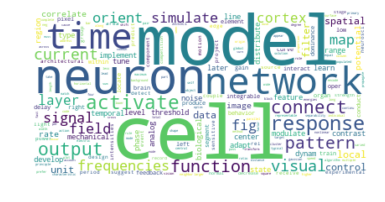

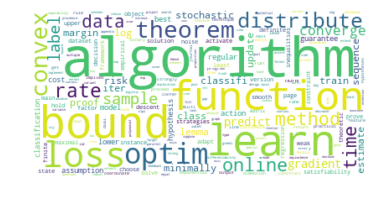

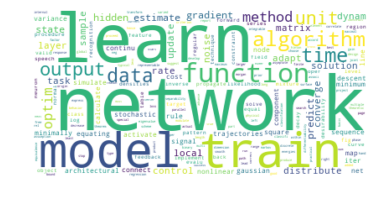

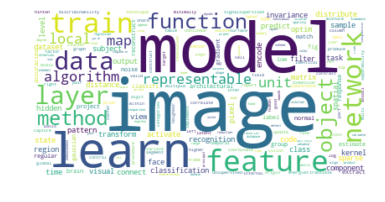

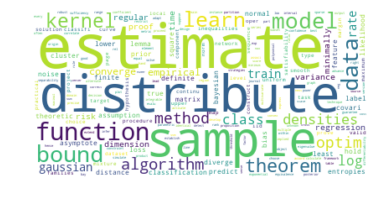

...

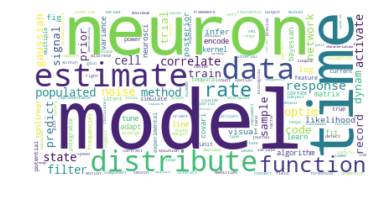

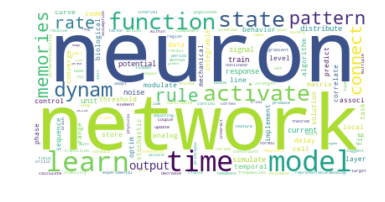

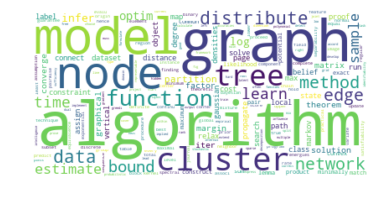

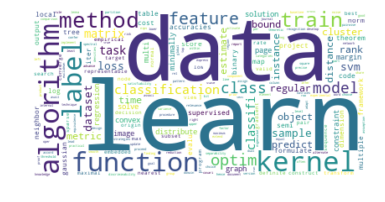

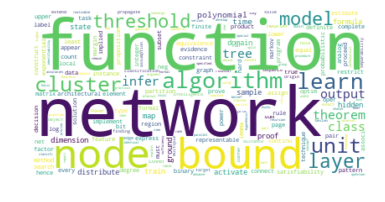

In [120]:
from wordcloud import WordCloud
selectedGroups = np.arange(1, new_K)   #defines which cluster to be represented
for g in selectedGroups:
    dicGroup = dict(zip(list(X.columns.values), list(new_P[g])))
    wordcloud = WordCloud( background_color='white')
    wordcloud.generate_from_frequencies(frequencies=dicGroup)
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

---
#### _Dataset_ $[5804 x 300]$

Para o novo _dataset_, seguindo as conformidades explicitadas na literatura [\[4\]](#Referências), realizamos os mesmos testes. Porém, sem tanta mudanças na magnitude dos valores.

In [125]:
from sklearn.mixture import GaussianMixture

def draw_aic_bic(n_components, dataset, cov='full'):
    models_gmm = [GaussianMixture(n_components=n, covariance_type=cov, max_iter=300).fit(dataset)
          for n in n_components]

    plt.plot(n_components, [m.bic(dataset) for m in models_gmm], label='BIC_GMM')
    plt.plot(n_components, [m.aic(dataset) for m in models_gmm], label='AIC_GMM')
    plt.legend(loc='best')
    plt.xlabel('n_components')
    plt.show()
    
    return models_gmm

<IPython.core.display.Javascript object>


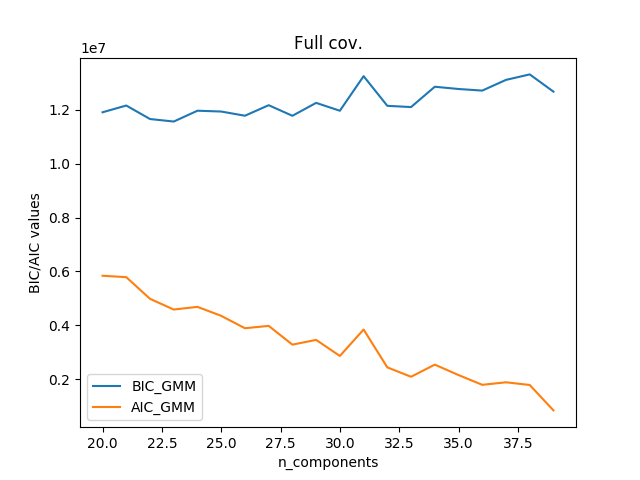

In [49]:
# Each component has its own general covariance matrix
gmms = draw_aic_bic(np.arange(20, 40), X_300, title='Full cov.')

<IPython.core.display.Javascript object>


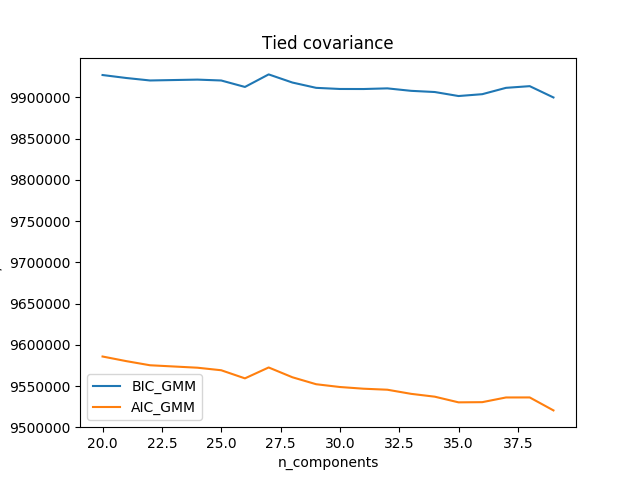

In [50]:
# All components share the same general covariance matrix
gmms = draw_aic_bic(np.arange(20, 40), X_300, title='Tied covariance', cov='tied')

<IPython.core.display.Javascript object>


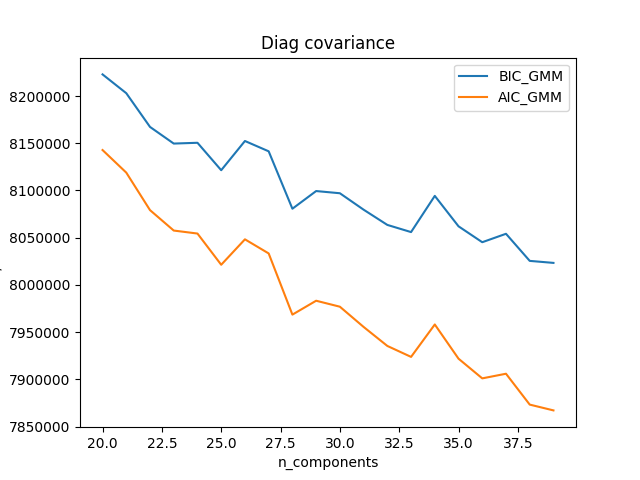

In [51]:
# Each component has its own diagonal covariance matrix
gmms_diag = draw_aic_bic(np.arange(20, 40), X_300, title='Diag covariance', cov='diag')

<IPython.core.display.Javascript object>


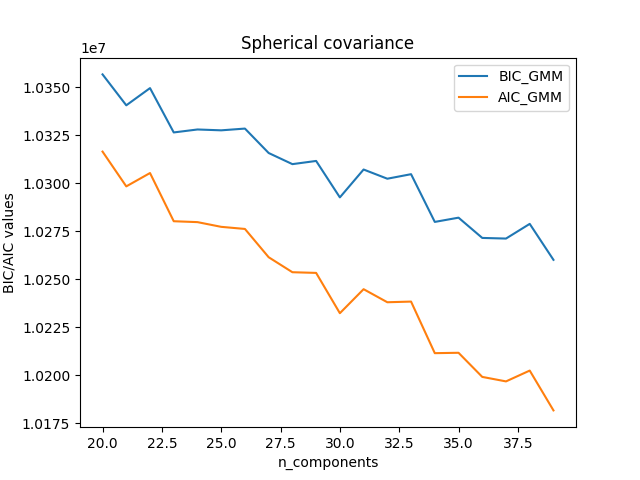

In [52]:
gmms_sph = draw_aic_bic(np.arange(20, 40), X_300, title='Spherical covariance', cov='spherical')

<IPython.core.display.Javascript object>


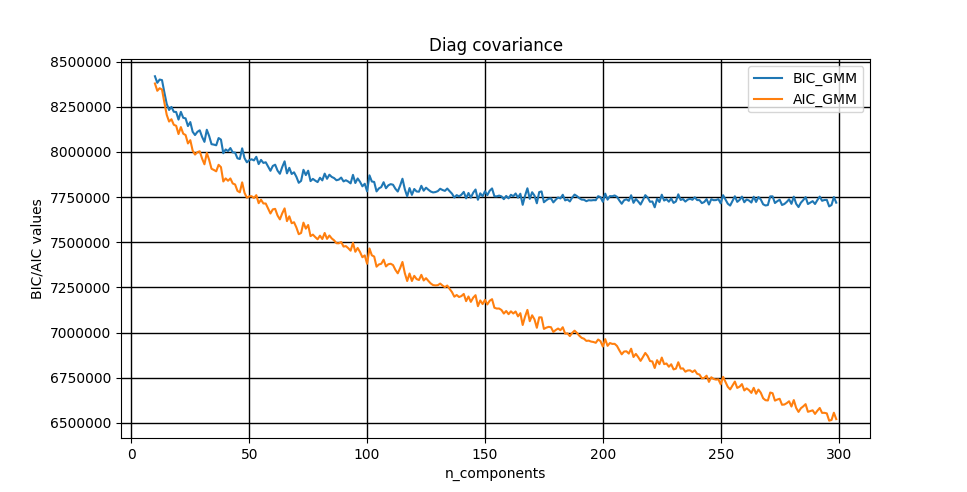

In [55]:
gmms_diag = draw_aic_bic(np.arange(10, 300), X_300, title='Diag covariance', cov='diag')

Utilizando a biblioteca dispinibilizada pelo artigo estudado, encontramos um valor de **21 clusters** para o _dataset_ de 300 _features_.

In [38]:
from EM import expectationMaximisation2

thresholdConvergence = 1
epsilon = .01
deltaInit = 0
L = len(X_300)
B = 300
K = 35

In [39]:
P_300,Pi_300,Rpost_300,logScore_300,logScores_300 = expectationMaximisation2(X_300.values,
                                                         K,
                                                         L,
                                                         B,
                                                         thresholdConvergence,
                                                         200)

1 -th short run of EM
Compute likelihood using current responsibility...
Number of bins:   300
Initial logScore:  -64980880.2543
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Comp

Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
4 -th short run of EM
Compute likelihood using current responsibility...
Number of bins:   300
Initial logScore:  -60591792.374
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Numb

Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / N

Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
E-step ...
Number of clusters:  35 / N

M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  20 / Last logScore:  -17030006.025 / New log score:  -17029564.8411 / Difference attained:  441.183869369
Current pi parameter:  [[  3.79080610e-02]
 [  9.12610987e-06]
 [  3.10046059e-02]
 [  5.18165552e-02]
 [  6.87722801e-02]
 [  1.72294969e-06]
 [  6.42751970e-02]
 [  2.72098500e-05]
 [  5.82829563e-02]
 [  8.60511425e-06]
 [  1.09005465e-05]
 [  4.69932909e-06]
 [  5.34304718e-06]
 [  1.72324660e-04]
 [  6.80458671e-02]
 [  4.35292876e-02]
 [  5.13399114e-02]
 [  1.87436738e-05]
 [  4.15592742e-02]
 [  3.77083042e-02]
 [  1.72325600e-04]
 [  5.00403515e-02]
 [  6.45826876e-06]
 [  2.61699533e-02]
 [  1.57297163e-04]
 [  7.56759589e-02]
 [  3.75270706e-02]
 [  3.08765175e-02]
 [  6.70377920e-02]
 [  3.61470732e-02]
 [  4.19923025e-02]
 [  4.81185219e-02]
 [  7.70195281e-05]
 [  3.14886706e-02]
 [  1.17121788e-05]]
E-step ...
Number of 

M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  28 / Last logScore:  -17027662.8228 / New log score:  -17027536.9047 / Difference attained:  125.918134101
Current pi parameter:  [[  3.79261283e-02]
 [  9.13114346e-06]
 [  3.03326602e-02]
 [  5.13015838e-02]
 [  6.67211146e-02]
 [  1.72294969e-06]
 [  6.49572469e-02]
 [  2.72248578e-05]
 [  5.86565183e-02]
 [  8.60511425e-06]
 [  1.09065588e-05]
 [  4.69932909e-06]
 [  5.34599419e-06]
 [  1.72324660e-04]
 [  6.79234340e-02]
 [  4.14395838e-02]
 [  5.08559608e-02]
 [  1.87540121e-05]
 [  4.20282950e-02]
 [  3.77784583e-02]
 [  1.72325600e-04]
 [  5.32568317e-02]
 [  6.46183089e-06]
 [  2.52016365e-02]
 [  1.57297163e-04]
 [  7.64556895e-02]
 [  3.77393520e-02]
 [  2.76773262e-02]
 [  6.96936342e-02]
 [  3.82061568e-02]
 [  4.16468276e-02]
 [  4.79578393e-02]
 [  7.70620090e-05]
 [  3.15601423e-02]
 [  1.17186388e-05]]
E-step ...
Number of

M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  36 / Last logScore:  -17026744.0943 / New log score:  -17026706.8788 / Difference attained:  37.2154388092
Current pi parameter:  [[  3.76959831e-02]
 [  9.13319336e-06]
 [  3.08421696e-02]
 [  5.10040287e-02]
 [  6.55419798e-02]
 [  1.72294969e-06]
 [  6.42887612e-02]
 [  2.72309697e-05]
 [  5.88738752e-02]
 [  8.60511425e-06]
 [  1.09090073e-05]
 [  4.69932908e-06]
 [  5.34719434e-06]
 [  1.72324660e-04]
 [  6.81071250e-02]
 [  3.91992766e-02]
 [  5.14927377e-02]
 [  1.87582223e-05]
 [  4.13828970e-02]
 [  3.74156859e-02]
 [  1.72325600e-04]
 [  5.42604013e-02]
 [  6.46328153e-06]
 [  2.67498892e-02]
 [  1.57297163e-04]
 [  7.65021961e-02]
 [  3.75688305e-02]
 [  2.74076768e-02]
 [  7.13561316e-02]
 [  3.84976873e-02]
 [  4.09645778e-02]
 [  4.82746924e-02]
 [  7.70793090e-05]
 [  3.18897800e-02]
 [  1.17212696e-05]]
E-step ...
Number of

Number of clusters:  35 / Number of bins:  300
M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  44 / Last logScore:  -17026141.3938 / New log score:  -17026059.1763 / Difference attained:  82.2175155506
Current pi parameter:  [[  3.77368533e-02]
 [  9.13028948e-06]
 [  3.06754752e-02]
 [  5.04319296e-02]
 [  6.46911081e-02]
 [  1.72294969e-06]
 [  6.42590322e-02]
 [  2.72223116e-05]
 [  5.87616837e-02]
 [  8.60511425e-06]
 [  1.09055388e-05]
 [  4.69932908e-06]
 [  5.34549421e-06]
 [  1.72324660e-04]
 [  6.78724315e-02]
 [  3.78113678e-02]
 [  5.23868226e-02]
 [  1.87522581e-05]
 [  4.03411449e-02]
 [  3.73929015e-02]
 [  1.72325600e-04]
 [  5.52145938e-02]
 [  6.46122655e-06]
 [  2.78854032e-02]
 [  1.57297163e-04]
 [  7.65047812e-02]
 [  3.79142948e-02]
 [  2.70424750e-02]
 [  7.20642249e-02]
 [  3.92808031e-02]
 [  4.08305359e-02]
 [  4.83235206e-02]
 [  7.70548018e-05]
 [  3.18950531

M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  52 / Last logScore:  -17025846.1608 / New log score:  -17025818.2033 / Difference attained:  27.9575077072
Current pi parameter:  [[  3.77364529e-02]
 [  9.12934964e-06]
 [  3.06751926e-02]
 [  4.91368770e-02]
 [  6.48154912e-02]
 [  1.72294969e-06]
 [  6.42665348e-02]
 [  2.72195095e-05]
 [  5.87648053e-02]
 [  8.60511425e-06]
 [  1.09044162e-05]
 [  4.69932909e-06]
 [  5.34494397e-06]
 [  1.72324660e-04]
 [  6.78830078e-02]
 [  3.77443160e-02]
 [  5.24024670e-02]
 [  1.87503278e-05]
 [  4.03330488e-02]
 [  3.74313518e-02]
 [  1.72325600e-04]
 [  5.55837616e-02]
 [  6.46056145e-06]
 [  2.72270369e-02]
 [  1.57297163e-04]
 [  7.65056094e-02]
 [  3.79148106e-02]
 [  2.73758867e-02]
 [  7.21053800e-02]
 [  4.00934552e-02]
 [  4.06656343e-02]
 [  4.80670619e-02]
 [  7.70468701e-05]
 [  3.25882711e-02]
 [  1.17163367e-05]]
E-step ...
Number of

M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  60 / Last logScore:  -17025560.9079 / New log score:  -17025548.0915 / Difference attained:  12.8164163828
Current pi parameter:  [[  3.75609559e-02]
 [  9.12938641e-06]
 [  3.06752816e-02]
 [  4.75525010e-02]
 [  6.41994524e-02]
 [  1.72294969e-06]
 [  6.43038422e-02]
 [  2.72196191e-05]
 [  5.87900919e-02]
 [  8.60511425e-06]
 [  1.09044601e-05]
 [  4.69932909e-06]
 [  5.34496549e-06]
 [  1.72324660e-04]
 [  6.80318035e-02]
 [  3.76181993e-02]
 [  5.24847492e-02]
 [  1.87504033e-05]
 [  4.01558598e-02]
 [  3.75430665e-02]
 [  1.72325600e-04]
 [  5.69751835e-02]
 [  6.46058747e-06]
 [  2.72270426e-02]
 [  1.57297163e-04]
 [  7.65063592e-02]
 [  3.80894339e-02]
 [  2.72989939e-02]
 [  7.26925747e-02]
 [  4.01689679e-02]
 [  4.06667765e-02]
 [  4.81725437e-02]
 [  7.70471803e-05]
 [  3.26027729e-02]
 [  1.17163839e-05]]
E-step ...
Number of

M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  68 / Last logScore:  -17025375.856 / New log score:  -17025348.4512 / Difference attained:  27.4048346542
Current pi parameter:  [[  3.74021672e-02]
 [  9.12494347e-06]
 [  3.06760392e-02]
 [  4.68628342e-02]
 [  6.43535702e-02]
 [  1.72294969e-06]
 [  6.46226920e-02]
 [  2.72063723e-05]
 [  5.89441441e-02]
 [  8.60511426e-06]
 [  1.08991533e-05]
 [  4.69932909e-06]
 [  5.34236429e-06]
 [  1.72324660e-04]
 [  6.78082979e-02]
 [  3.76156634e-02]
 [  5.25578347e-02]
 [  1.87412782e-05]
 [  4.01599966e-02]
 [  3.71956306e-02]
 [  1.72325600e-04]
 [  5.72163445e-02]
 [  6.45744334e-06]
 [  2.72244582e-02]
 [  1.57297163e-04]
 [  7.65033223e-02]
 [  3.80915838e-02]
 [  2.74078815e-02]
 [  7.28548681e-02]
 [  4.06257701e-02]
 [  4.04864378e-02]
 [  4.80490579e-02]
 [  7.70096843e-05]
 [  3.26579388e-02]
 [  1.17106819e-05]]
E-step ...
Number of 

M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  76 / Last logScore:  -17025100.1477 / New log score:  -17025035.2687 / Difference attained:  64.8789825961
Current pi parameter:  [[  3.75412090e-02]
 [  9.12123811e-06]
 [  3.06804710e-02]
 [  4.69581595e-02]
 [  6.44929701e-02]
 [  1.72294969e-06]
 [  6.53600286e-02]
 [  2.71953247e-05]
 [  5.90360127e-02]
 [  8.60511426e-06]
 [  1.08947275e-05]
 [  4.69932909e-06]
 [  5.34019492e-06]
 [  1.72324660e-04]
 [  6.53335309e-02]
 [  3.76170509e-02]
 [  5.25319366e-02]
 [  1.87336680e-05]
 [  4.03665231e-02]
 [  3.68759970e-02]
 [  1.72325600e-04]
 [  5.71988977e-02]
 [  6.45482117e-06]
 [  2.70546368e-02]
 [  1.57297163e-04]
 [  7.64138682e-02]
 [  3.85681991e-02]
 [  2.78110645e-02]
 [  7.42566248e-02]
 [  4.01568566e-02]
 [  4.03220878e-02]
 [  4.80493811e-02]
 [  7.69784131e-05]
 [  3.26910947e-02]
 [  1.17059266e-05]]
E-step ...
Number of

M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  84 / Last logScore:  -17024566.5505 / New log score:  -17024530.2757 / Difference attained:  36.2747117504
Current pi parameter:  [[  3.72338190e-02]
 [  9.11522969e-06]
 [  3.08714097e-02]
 [  4.65273515e-02]
 [  6.44912451e-02]
 [  1.72294969e-06]
 [  6.56179620e-02]
 [  2.71774103e-05]
 [  5.87806611e-02]
 [  8.60511426e-06]
 [  1.08875508e-05]
 [  4.69932909e-06]
 [  5.33667718e-06]
 [  1.72324660e-04]
 [  6.53008137e-02]
 [  3.76192056e-02]
 [  5.25426264e-02]
 [  1.87213275e-05]
 [  4.10209202e-02]
 [  3.70586718e-02]
 [  1.72325600e-04]
 [  5.71908763e-02]
 [  6.45056919e-06]
 [  2.70547239e-02]
 [  1.57297163e-04]
 [  7.40719186e-02]
 [  3.92788284e-02]
 [  2.85904660e-02]
 [  7.46076586e-02]
 [  4.03416515e-02]
 [  4.03730294e-02]
 [  4.80494854e-02]
 [  7.69277051e-05]
 [  3.26933862e-02]
 [  1.16982155e-05]]
E-step ...
Number of

M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  92 / Last logScore:  -17024217.6665 / New log score:  -17024192.2761 / Difference attained:  25.3904032037
Current pi parameter:  [[  3.72162736e-02]
 [  9.11700474e-06]
 [  3.10165462e-02]
 [  4.65274304e-02]
 [  6.43124548e-02]
 [  1.72294969e-06]
 [  6.54927254e-02]
 [  2.71827027e-05]
 [  5.89608987e-02]
 [  8.60511426e-06]
 [  1.08896710e-05]
 [  4.69932909e-06]
 [  5.33771642e-06]
 [  1.72324660e-04]
 [  6.49459065e-02]
 [  3.75777110e-02]
 [  5.27284974e-02]
 [  1.87249732e-05]
 [  4.10151224e-02]
 [  3.70503566e-02]
 [  1.72325600e-04]
 [  5.70168646e-02]
 [  6.45182534e-06]
 [  2.70542253e-02]
 [  1.57297163e-04]
 [  7.26951732e-02]
 [  3.91188197e-02]
 [  2.84347051e-02]
 [  7.68884460e-02]
 [  3.99717782e-02]
 [  4.03216007e-02]
 [  4.80888469e-02]
 [  7.69426856e-05]
 [  3.28822954e-02]
 [  1.17004936e-05]]
E-step ...
Number of

M-step...
Number of clusters:  35 / Number of bins:  300
Compute likelihood using current responsibility...
Number of bins:   300
Itération number:  100 / Last logScore:  -17024001.1059 / New log score:  -17023974.259 / Difference attained:  26.8468308747
Current pi parameter:  [[  3.72117307e-02]
 [  9.11940040e-06]
 [  3.05322285e-02]
 [  4.65216915e-02]
 [  6.41618805e-02]
 [  1.72294969e-06]
 [  6.58534054e-02]
 [  2.71898454e-05]
 [  5.87882277e-02]
 [  8.60511426e-06]
 [  1.08925325e-05]
 [  4.69932909e-06]
 [  5.33911900e-06]
 [  1.72324660e-04]
 [  6.42754622e-02]
 [  3.76001160e-02]
 [  5.26878645e-02]
 [  1.87298936e-05]
 [  4.10151974e-02]
 [  3.70501986e-02]
 [  1.72325600e-04]
 [  5.70433194e-02]
 [  6.45352068e-06]
 [  2.70541917e-02]
 [  1.57297163e-04]
 [  7.23692315e-02]
 [  3.91076994e-02]
 [  2.82629908e-02]
 [  7.88760462e-02]
 [  3.98972138e-02]
 [  4.00983247e-02]
 [  4.82176864e-02]
 [  7.69629037e-05]
 [  3.26919273e-02]
 [  1.17035681e-05]]
E-step ...
Number of

In [40]:
results_300 = readjustEM(X_300.values, 
                     L, 
                     B, 
                     P_300,
                     Pi_300,
                     Rpost_300,
                     logScore_300,
                     logScores_300,
                     1,
                     0.01,
                     maxIterations = 300
                    )

Relative threshold under which the cluster is considered to disappear:  0.00028571428571428574
Disappearing indexes :  [ 1  5  7  9 10 11 12 13 17 20 22 24 32 34]
There exist disapearing mixture proportions! Running adjusted EM...
New adjusted number of clusters :  21
[ 0.03723718  0.03055311  0.0465535   0.06420576  0.06589844  0.05882843
  0.06431942  0.03762583  0.05272389  0.04104324  0.03707553  0.05708233
  0.02707269  0.07241872  0.03913444  0.02828232  0.07892998  0.0399245
  0.04012575  0.04825066  0.03271428]
Current pi parameter:  [ 0.03723718  0.03055311  0.0465535   0.06420576  0.06589844  0.05882843
  0.06431942  0.03762583  0.05272389  0.04104324  0.03707553  0.05708233
  0.02707269  0.07241872  0.03913444  0.02828232  0.07892998  0.0399245
  0.04012575  0.04825066  0.03271428]
Compute likelihood using current responsibility...
Number of bins:   300
Initial logScore:  -17025766.3798
E-step ...
Number of clusters:  21 / Number of bins:  300
M-step...
Number of clusters:  

### Visualização da clusterização

Dado o tamanho da dimensionalidade do conjunto de dados, se torna inviável a visualização dos resultados por meio de gráficos comuns, dessa forma buscou-se visualizar os _clusters_ via **_Word Cloud_**. Já que o cerne do problema é texto, podemos criar um gráfico _Word Cloud_ para representar a **probabilidade de cada palavra**. Dessa forma podemos deduzir qual _cluster_ se refere a qual assunto.

Outra visualização possível é a visualização através do tempo, já que também temos o **_timestamp_ de cada artigo**. Dessa forma, podemos visualizar qual é a **distribuição temporal de cada _cluster_** dentro do conjunto de dados no NIPS.

In [24]:
from wordcloud import WordCloud

def wordcloud_from_pred(groups_to_plot, predictions, dataset, titles=[], verbose=1):
    n_groups = np.max(predictions) + 1
    counts = [len([i for i in predictions if i == j]) for j in range(n_groups)]    

    if len(groups_to_plot) < 1:
        raise Exception('Need to select at least 1 group to plot')
    elif np.max(groups_to_plot) > n_groups or len(groups_to_plot) > n_groups + 1:
        raise Exception('Groups to plot exceeded the prediction groups: {} > {}'
                            .format(len(groups_to_plot), n_groups))
    
    for index, group in enumerate(groups_to_plot):
        rows_wth_sg = [i for i, x in enumerate(predictions) if x == group]
        dictionary = dataset.iloc[rows_wth_sg].sum(axis=0)
        legend = dictionary.nlargest(12).index.values
        dict_sg = dict(zip(dictionary.index.values, dictionary.values))

        wordcloud = WordCloud( background_color='white')
        wordcloud.generate_from_frequencies(frequencies=dict_sg)
        plt.figure()
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        
        group_cadidates_count = ('group {} with {} candidates'
                                     .format(group, counts[group]))
        try:
            title = titles[index]
            if title == '':
                raise Exception('Empty title')
        except Exception as e:
            title = group_cadidates_count
        
        plt.title(title)
        plt.show()
        
        if verbose > 0:
            print(group_cadidates_count)
            print(legend)

In [8]:
import re

def get_indexes_group(prediction, group):
    return [i for i, p in enumerate(prediction) if p == group]

def get_group_years(prediction, y):
    groups_years = []
    for group in set(sorted(prediction)):
        g_ind = get_indexes_group(prediction, group)
        g_years = y[g_ind]
        g_years = [int(re.search('\d+', year).group(0)) for year in g_years] 
        groups_years.append(g_years)
    
    return groups_years

def create_column(legend, start_index, end_index):
    column = ''
    for i in range(start_index, end_index):
        column += legend[i]
        if i < end_index - 1:
            column += '\n'
            
    return column

def plot_timeline(years, legend, title='Articles'):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    props = dict(boxstyle='square', facecolor='white', alpha=0)

    first_column = create_column(legend, 0, int(len(legend)/2))
    second_column = create_column(legend, int(len(legend)/2), len(legend))

    ax.text(0.6, 0.95, first_column, transform=ax.transAxes, fontsize=12,
             multialignment = 'left' , verticalalignment='top', bbox=props)
    ax.text(0.8, 0.95, second_column, transform=ax.transAxes, fontsize=12,
             multialignment = 'left' , verticalalignment='top', bbox=props)

    x = np.arange(1987, 2016)
    count_articles_at_year = [years.count(year) for year in x]
    ax.plot(x, count_articles_at_year, color='red')

    plt.title('{} through the years'.format(title))
    plt.xlabel('Year')
    plt.xticks(x, rotation=60) 
    plt.ylabel('Articles')
    ax.grid(axis='x', linestyle='--', linewidth=0.3)
    plt.show()
    
    return fig

In [9]:
def get_sorted_clusters_count(prediction, n_clusters):
    counts = [(index, len([i for i in prediction if i == j])) for index, j in enumerate(np.arange(0, n_clusters))]
    sorted_counts = sorted(counts, key=lambda tup: tup[1], reverse=True)

    return sorted_counts

### Visualização de 73 _clusters_
#### _Dataset_ (5804, 300)

In [131]:
gmm_o = GaussianMixture(n_components=73, covariance_type='diag', max_iter=300).fit(X_300)

In [133]:
gmm_pred = gmm_o.predict(X_300)

In [238]:
sorted_counts = get_sorted_clusters_count(gmm_pred, 73)
print(sorted_counts)

[(28, 326), (56, 226), (16, 220), (70, 198), (0, 170), (23, 160), (18, 142), (46, 127), (11, 126), (38, 122), (72, 119), (6, 115), (32, 113), (5, 109), (7, 109), (9, 109), (47, 109), (62, 109), (19, 106), (55, 106), (14, 104), (50, 98), (13, 97), (51, 95), (64, 92), (49, 90), (25, 84), (59, 74), (8, 73), (43, 71), (61, 71), (63, 69), (22, 67), (65, 67), (48, 66), (26, 63), (10, 62), (31, 62), (53, 62), (37, 61), (12, 60), (44, 60), (24, 58), (54, 58), (30, 57), (52, 55), (66, 55), (3, 53), (45, 53), (69, 53), (2, 51), (17, 51), (41, 51), (60, 51), (71, 51), (21, 50), (33, 50), (34, 50), (29, 49), (35, 46), (68, 46), (15, 43), (27, 41), (42, 40), (58, 35), (39, 31), (1, 13), (57, 13), (36, 10), (20, 8), (40, 6), (4, 4), (67, 3)]


Aqui temos os 5 maiores clusters criados pelo GMM com 73 componentes. Podemos distinguir 2 temas de artigos apenas olhando as palavras mais frequentes nesse _cluster_.

* **Neural Network**: Discriminado principalmente pelas palavras
    * 'neuron', 'cell', 'network', 'activate', 'connect', 'map'
    
    
* **Reinforcement Learning**: Discriminado principalmente pelas palavra
    * 'policies', 'state', 'action', 'reward'

<IPython.core.display.Javascript object>


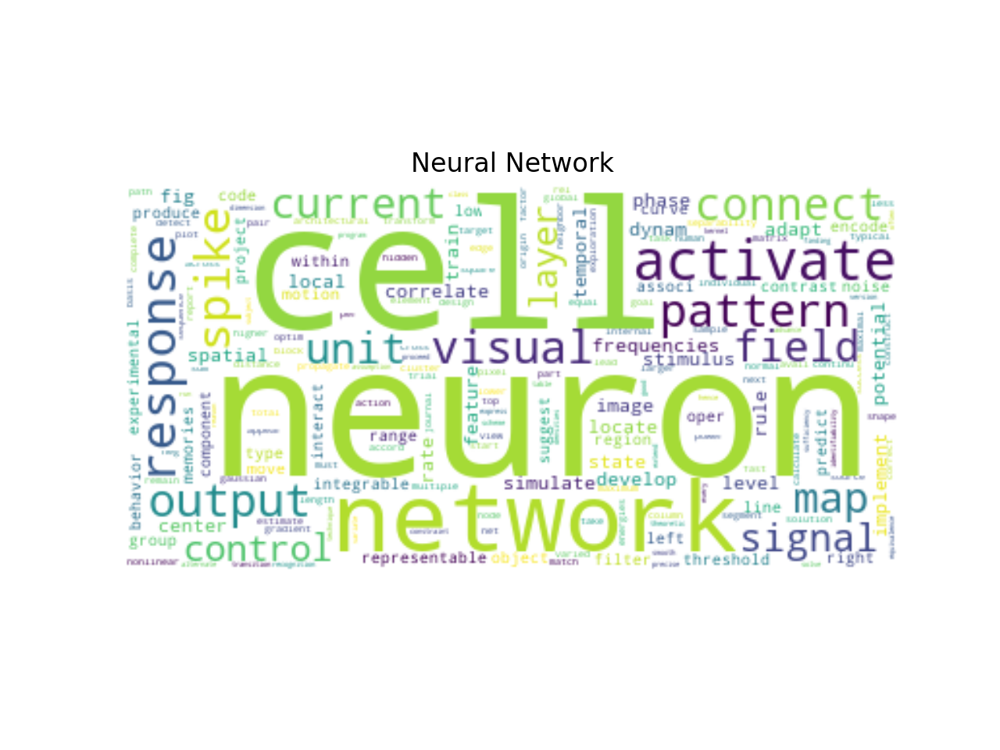

group 28 with 326 candidates
['neuron' 'cell' 'network' 'activate' 'response' 'spike' 'pattern' 'output'
 'visual' 'connect' 'unit' 'map']


<IPython.core.display.Javascript object>


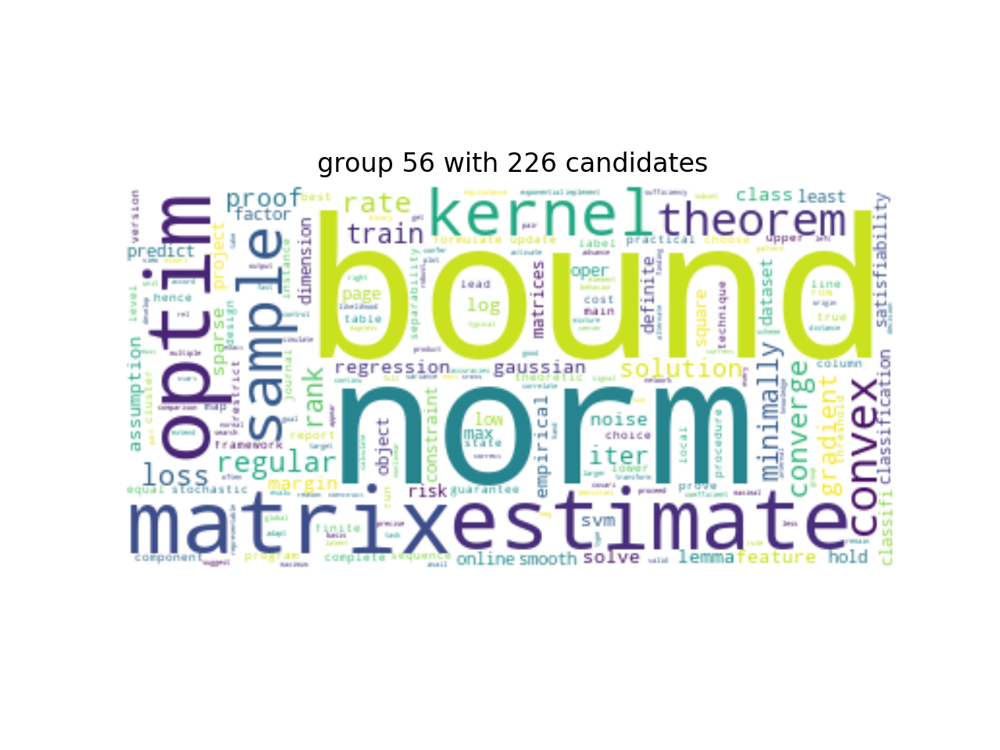

group 56 with 226 candidates
['bound' 'norm' 'matrix' 'optim' 'estimate' 'kernel' 'sample' 'theorem'
 'convex' 'regular' 'converge' 'rate']


<IPython.core.display.Javascript object>


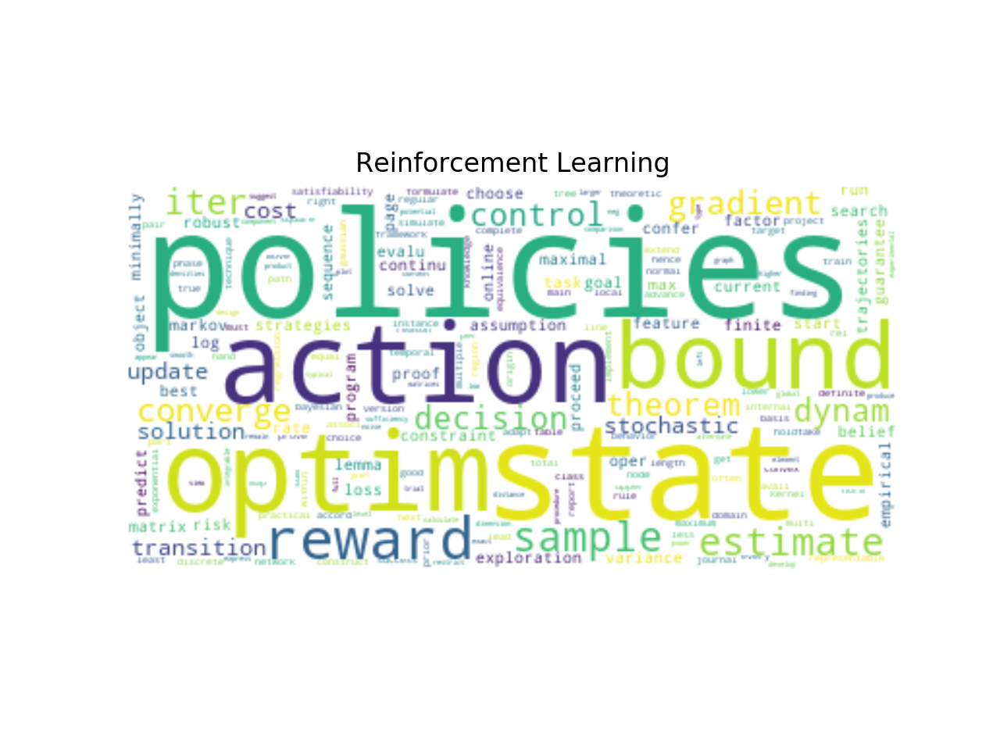

group 16 with 220 candidates
['policies' 'state' 'action' 'optim' 'bound' 'reward' 'sample' 'estimate'
 'iter' 'gradient' 'converge' 'theorem']


<IPython.core.display.Javascript object>


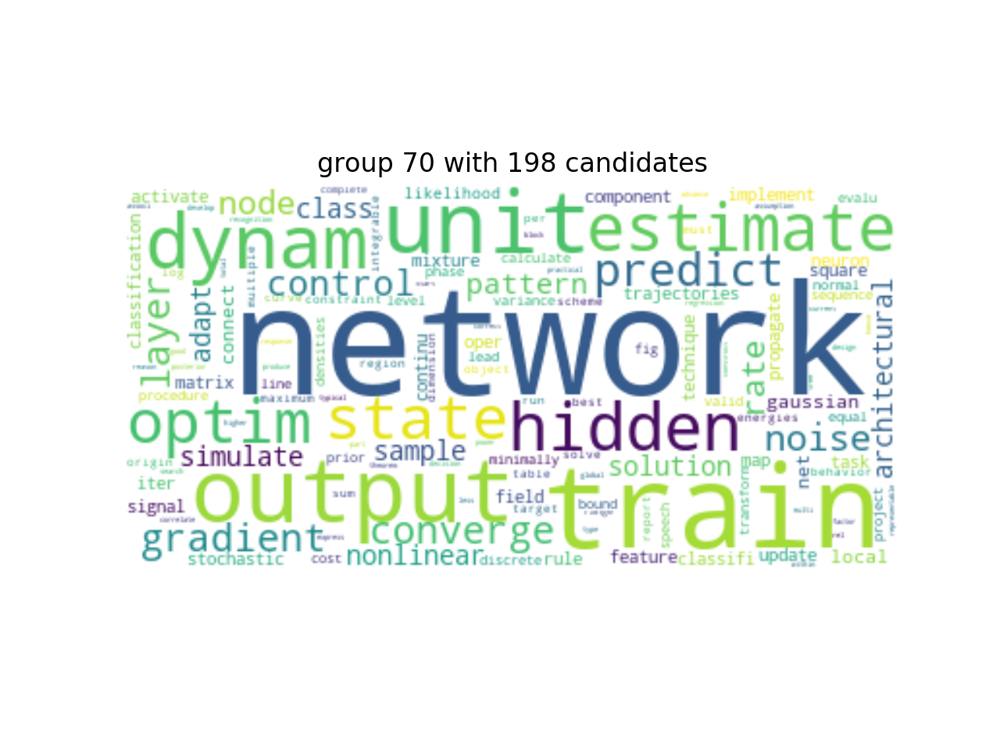

group 70 with 198 candidates
['network' 'train' 'output' 'unit' 'dynam' 'estimate' 'hidden' 'optim'
 'state' 'predict' 'gradient' 'converge']


<IPython.core.display.Javascript object>


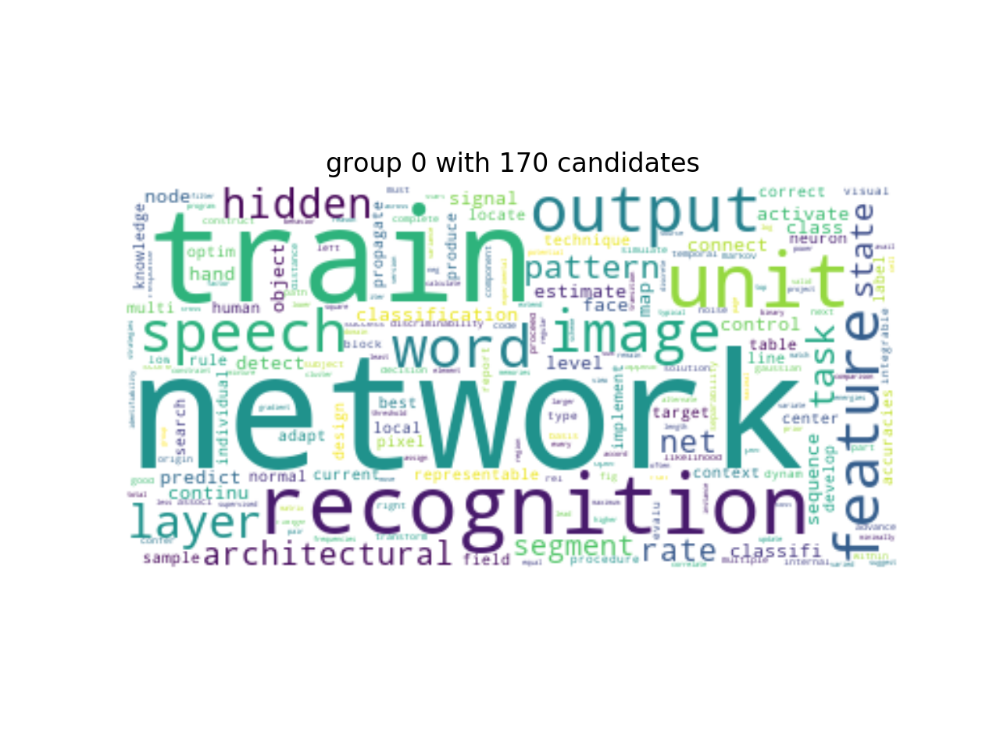

group 0 with 170 candidates
['network' 'train' 'recognition' 'unit' 'output' 'feature' 'image' 'speech'
 'word' 'layer' 'hidden' 'task']


In [155]:
selected_groups = [i for i, n in sorted_counts]
wordcloud_from_pred(selected_groups[:5],
                    gmm_pred,
                    X_300,
                    titles=['Neural Network', '', 'Reinforcement Learning'])

Nesse momento podemos **visualizar os _clusters_ através do tempo**, como cada assunto/_cluster_ se comportou através dos anos.

Para essa visualização colocamos as 12 palavras mais frequentes em cada _cluster_ e a contagem de artigos por ano. 

Pode-se notar **3 grupos** muito parecidos em suas palavras caracteristicas, onde todas podem remeter à **"_Reinforcement Learning_"**, isso pode nos mostrar que nossos clusters não estão perfeitos e que alguns grupos podem ser somados em apenas um.

<IPython.core.display.Javascript object>


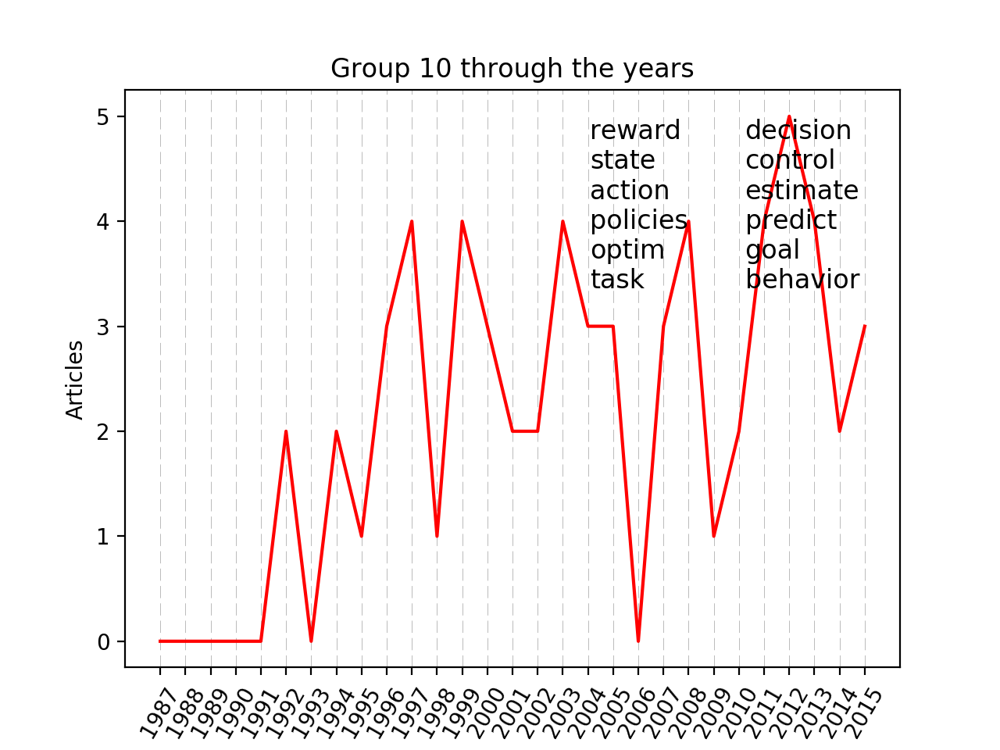

<IPython.core.display.Javascript object>


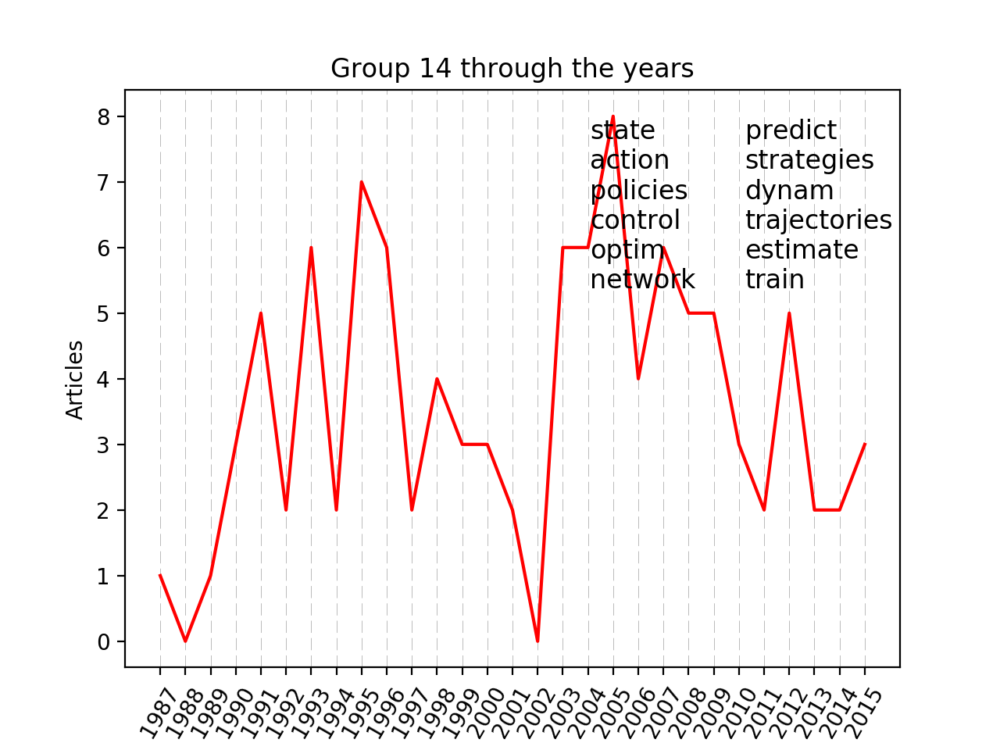

<IPython.core.display.Javascript object>


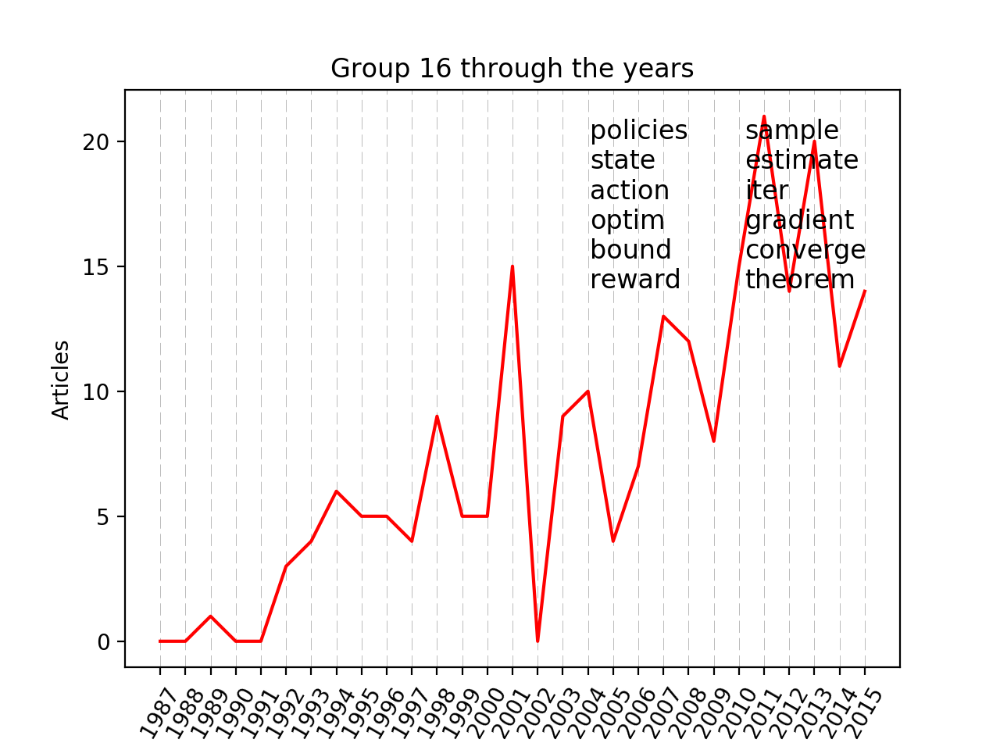

In [235]:
groups_years = get_group_years(gmm_pred, y)
reinforcement_learning = [10, 14, 16]
selected_groups = [(i, groups_years[i]) for i in reinforcement_learning]

for group, years_group in selected_groups:
    group_indexes = get_indexes_group(gmm_pred, group)
    dictionary = X_300.iloc[group_indexes].sum(axis=0)
    legend = dictionary.nlargest(12).index.values
    
    plot_timeline(years_group, legend, title='Group {}'.format(group))

### Visualização de 21 _clusters_
#### _Dataset_ (5804, 300)

In [13]:
from sklearn.mixture import GaussianMixture
gmm_21 = GaussianMixture(n_components=21, covariance_type='diag', max_iter=300).fit(X_300)

In [14]:
gmm_21_pred = gmm_21.predict(X_300)

In [25]:
sorted_counts = get_sorted_clusters_count(gmm_21_pred, 21)
print(sorted_counts)

[(20, 578), (18, 508), (6, 455), (2, 382), (3, 352), (12, 332), (11, 329), (9, 311), (7, 309), (8, 306), (13, 230), (4, 226), (17, 204), (19, 196), (16, 188), (0, 184), (15, 160), (1, 158), (5, 152), (10, 136), (14, 108)]


<IPython.core.display.Javascript object>


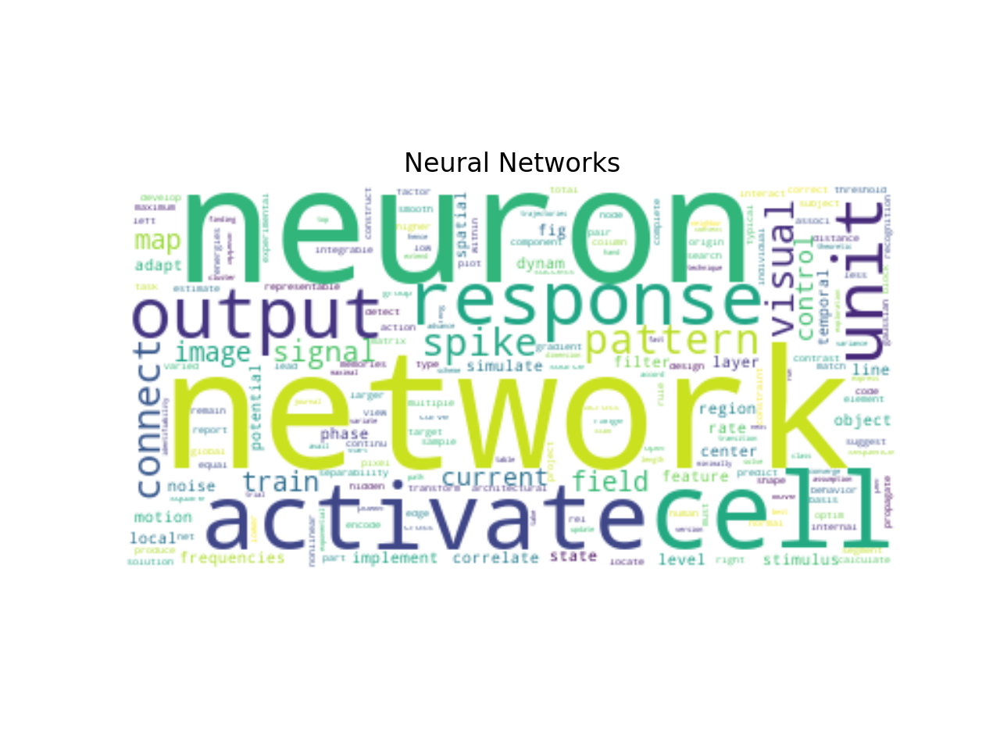

group 20 with 578 candidates
['network' 'neuron' 'cell' 'activate' 'response' 'output' 'unit' 'pattern'
 'visual' 'spike' 'connect' 'signal']


<IPython.core.display.Javascript object>


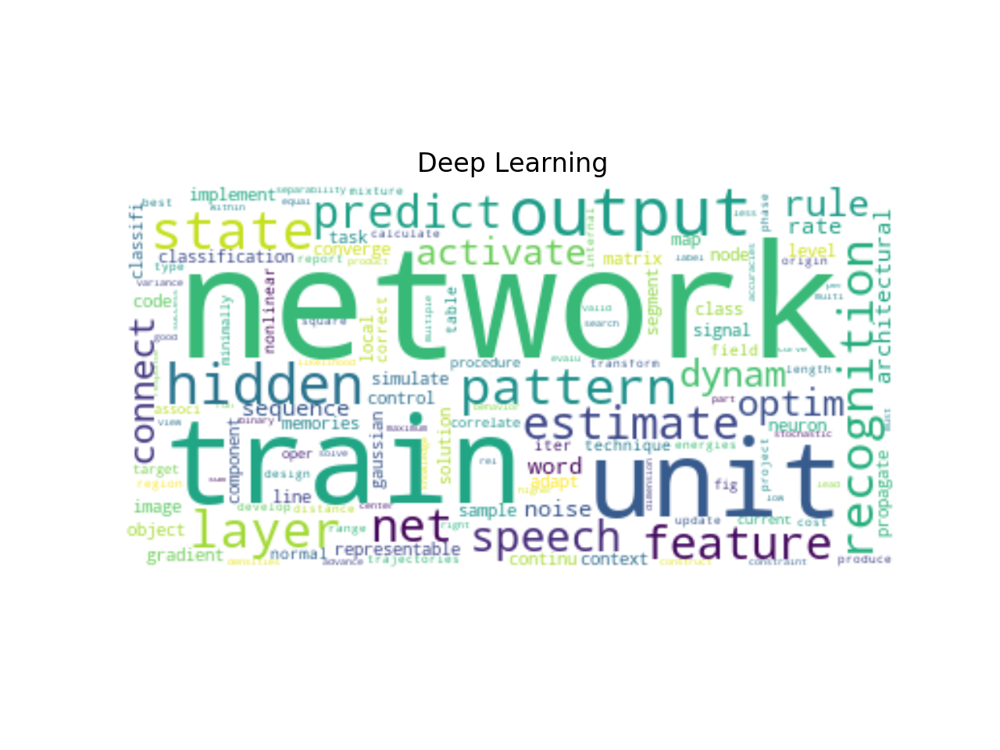

group 18 with 508 candidates
['network' 'train' 'unit' 'output' 'hidden' 'state' 'pattern' 'layer'
 'recognition' 'net' 'feature' 'estimate']


<IPython.core.display.Javascript object>


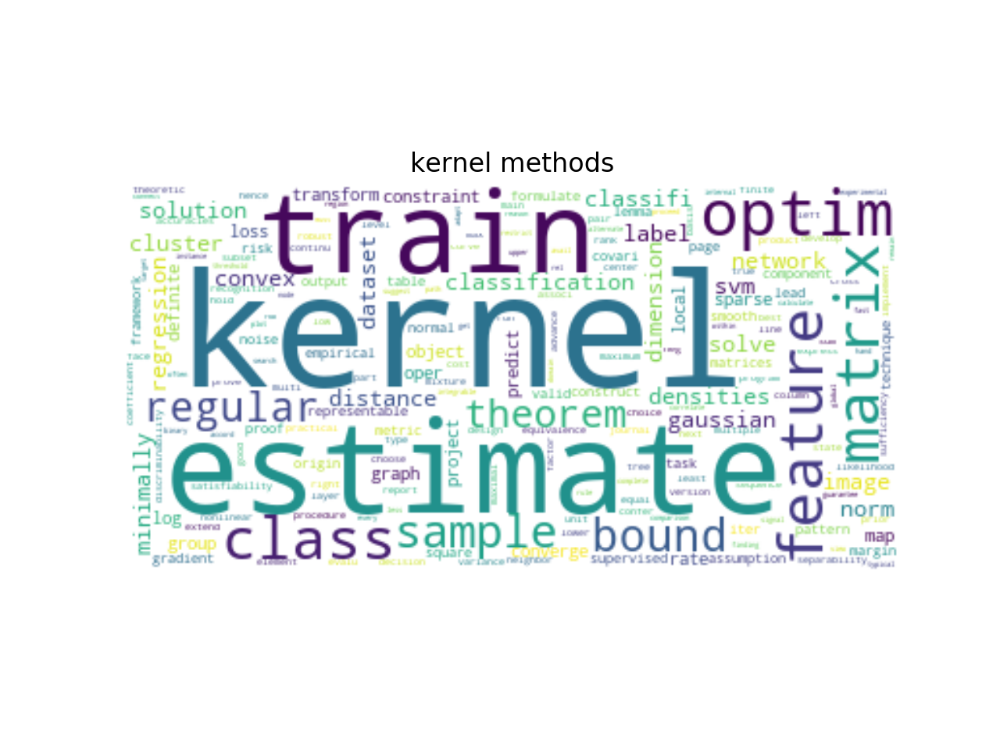

group 6 with 455 candidates
['kernel' 'estimate' 'train' 'optim' 'matrix' 'feature' 'class' 'sample'
 'bound' 'regular' 'theorem' 'classification']


<IPython.core.display.Javascript object>


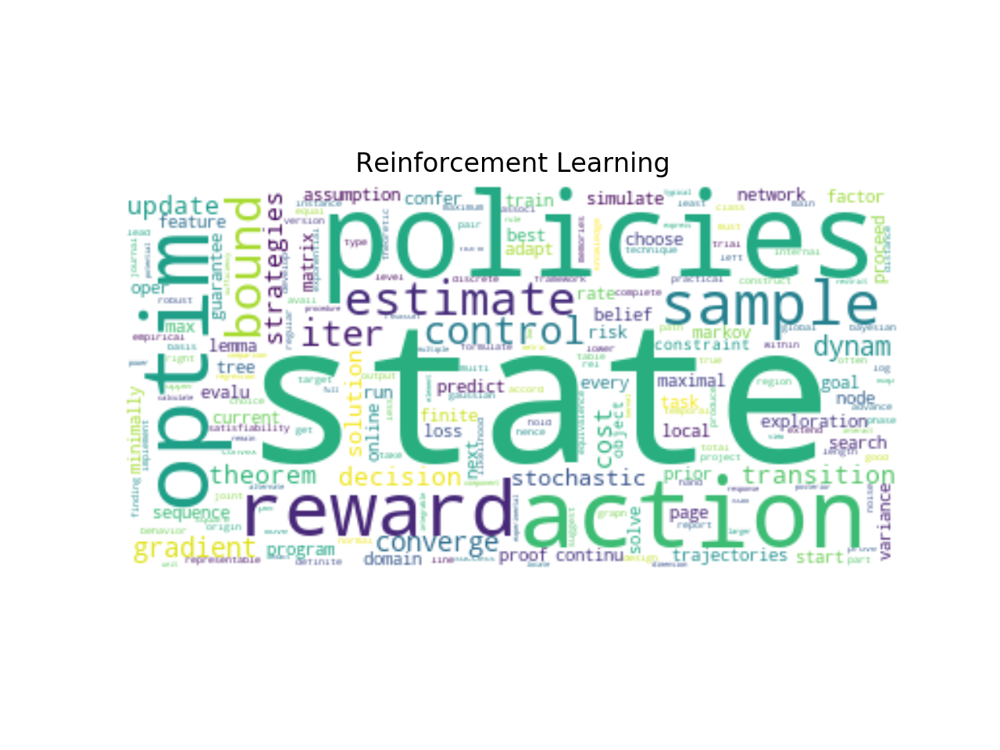

group 2 with 382 candidates
['state' 'policies' 'action' 'optim' 'reward' 'sample' 'estimate' 'bound'
 'control' 'iter' 'converge' 'dynam']


<IPython.core.display.Javascript object>


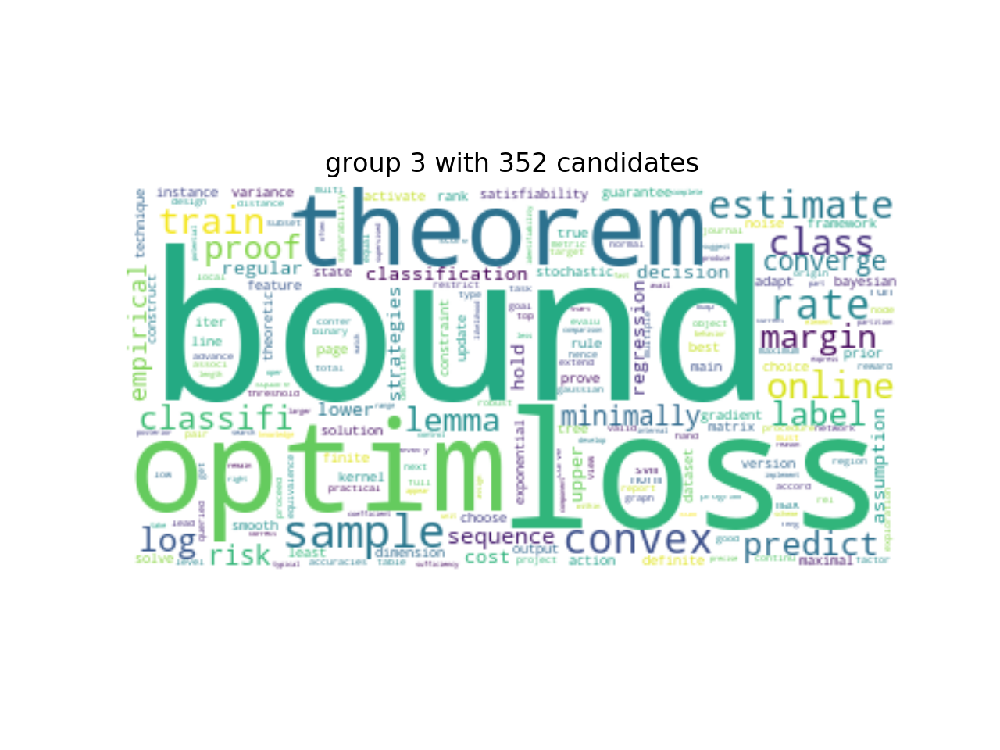

group 3 with 352 candidates
['bound' 'loss' 'optim' 'theorem' 'sample' 'rate' 'convex' 'estimate'
 'class' 'train' 'online' 'predict']


In [40]:
selected_groups = [i for i, n in sorted_counts]
titles = ['Neural Networks', 'Deep Learning', 'kernel methods', 'Reinforcement Learning', '']
wordcloud_from_pred(selected_groups[:5],
                    gmm_21_pred,
                    X_300,
                   titles = titles)

<IPython.core.display.Javascript object>


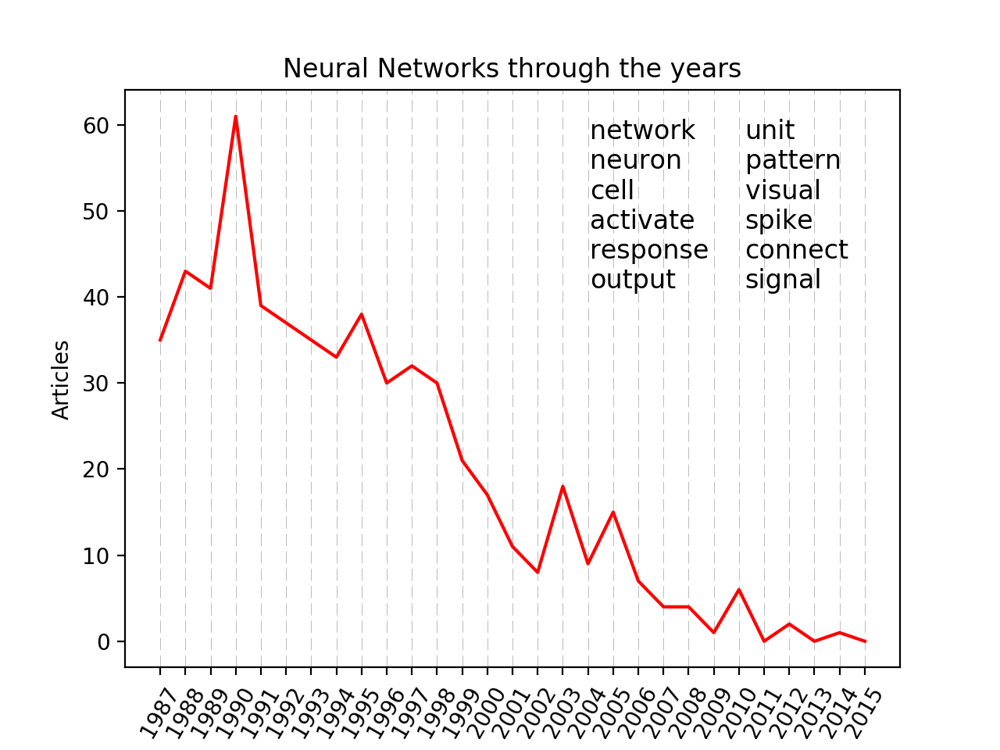

<IPython.core.display.Javascript object>


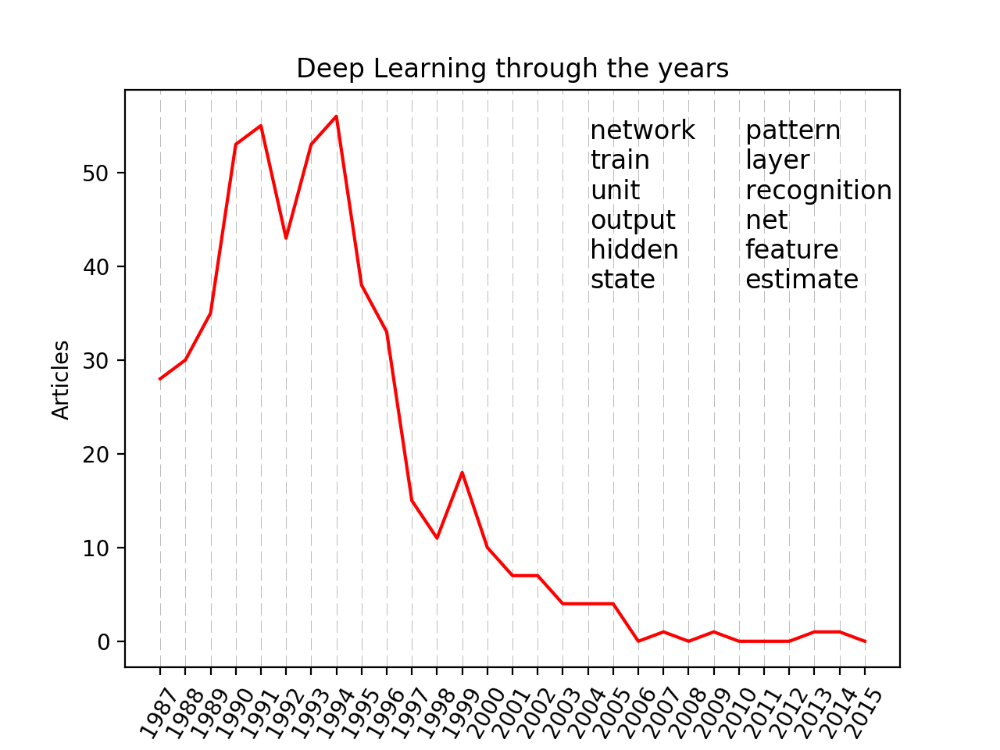

<IPython.core.display.Javascript object>


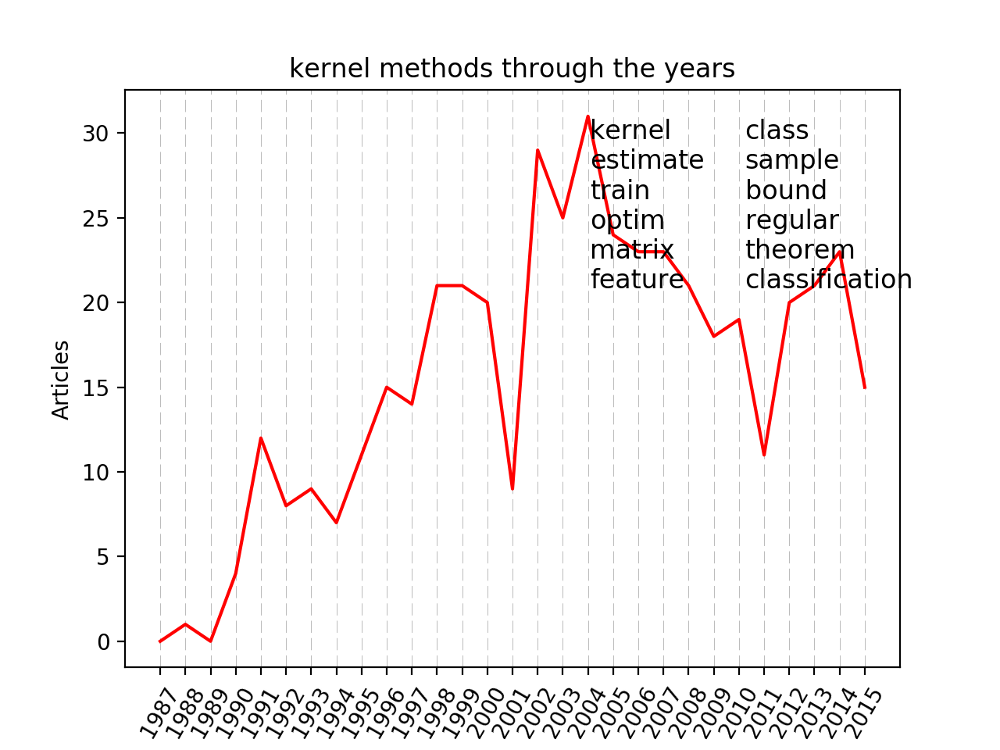

<IPython.core.display.Javascript object>


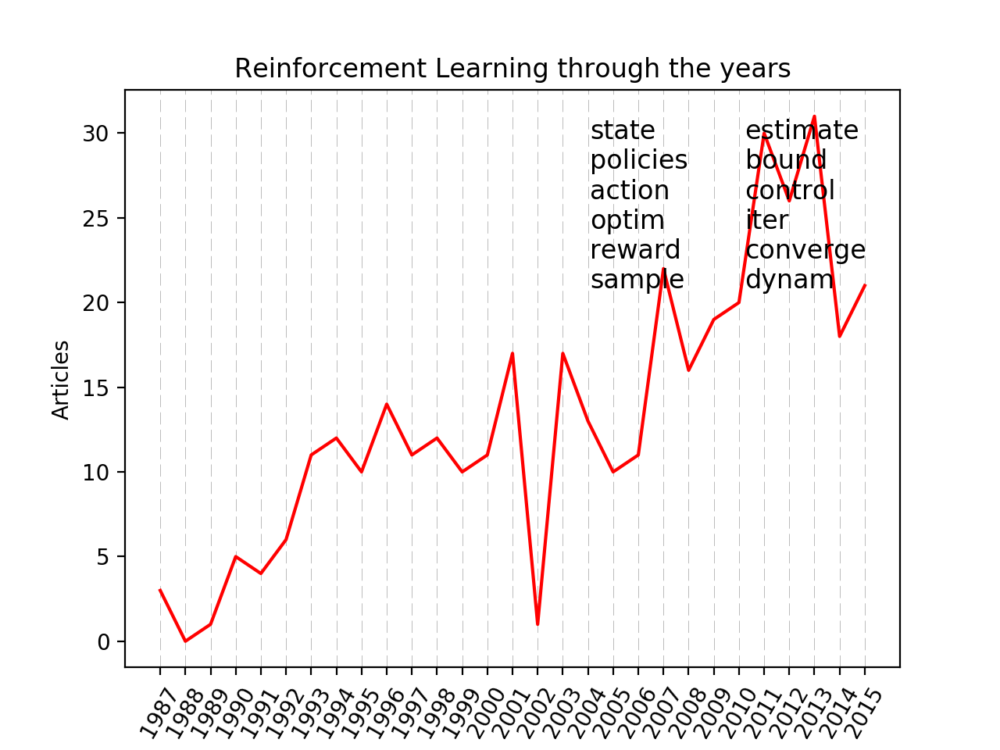

<IPython.core.display.Javascript object>


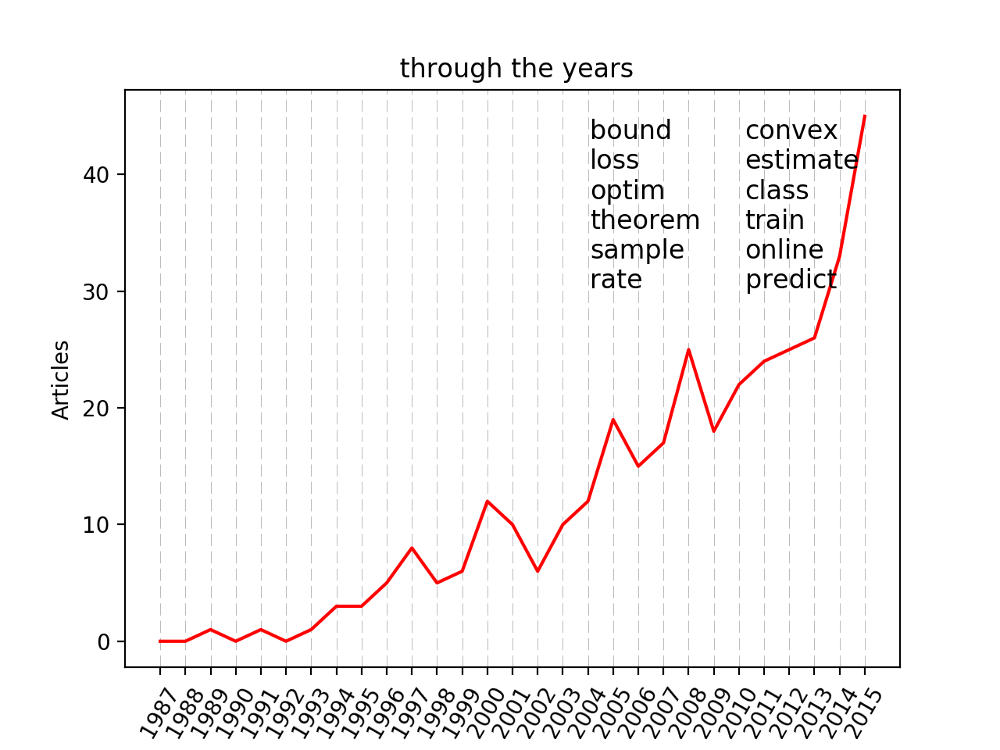

In [42]:
groups_years = get_group_years(gmm_21_pred, y_300)
selected_groups = selected_groups
selected_groups_21 = [(i, groups_years[i]) for i in selected_groups]

j=0
for group, years_group in selected_groups_21[:5]:
    group_indexes = get_indexes_group(gmm_21_pred, group)
    dictionary = X_300.iloc[group_indexes].sum(axis=0)
    legend = dictionary.nlargest(12).index.values
    
    plot_timeline(years_group, legend, title='{}'.format(titles[j]))
    j+=1

## Conclusão

Dessa forma podemos dizer que o melhor resultado e $K$ escolhido, dentro do escopo realizado foi **$K = 21$** para um dataset de 300 palavras. Dito isso, tal resultado diferiu do que foi lido na literatura, porém acreditamos que **bons resultados foram alcançados** e o objetivo sobre o aprendizado para esse problema foi aprendido. Foi adquirido um conhecimento sobre como atacar problemas não supervisionados, como **lidar com situações onde não existem _labels_** para os dados e há pouca explicação para o conjunto de dados. Porém, existem pontos onde poderiamos melhorar nossa solução, em um cenário onde o recurso **tempo não fosse um atrapalhador**, poderiamos **gerar mais análises** mesmo com baixo recurso computacional, levando assim a possíveis descobertas que não foram possíveis por falta de análise. Outro ponto que poderíamos melhorar é na pesquisa e leitura de mais material da literatura, já que existem muitas fontes e muitos pontos inexplorados como _Self Organizing Maps_, _DBSCAN_ e demais modelos para aprendizado não supervisionado. Portanto, cremos que foi atingido um bom patamar com o resultado entregue, porém há o que melhorar.

---
<center><label><a href="https://github.com/DaniloBarros">@DaniloBarros</a>   -&-   <a href="https://github.com/Bumbleblo">@Bumbleblo</a></label></center>
<center><a href="https://github.com/Segmentation-Fault-Machine-Learning">Segmentation Fault</a> - GitHub</center>
<center>UnB - Universidade de Brasília - 2017</center>